# Analysis in one notebook

Present all analysis used in the manuscript here. Including plots, DE anlysis, volcano plot, trajectory analysis, Adding unspliced counts.  

## Load library and define param

In [1]:
import scvelo as scv
import scanpy as sc
import numpy as np
import pandas as pd
import pyranges as pr
import subprocess

from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

scv.set_figure_params(dpi_save=300, vector_friendly=False)

In [45]:
# Load self maintained functions
# reload to make sure changes are reloaded
import de_enr
import plot_func
import venn
import run_string
from importlib import reload  
reload(de_enr)
reload(plot_func)
reload(venn)
reload(run_string)
from de_enr import *
from plot_func import *
from venn import *
from run_string import *

In [3]:
dotsize = 20
fontsize = 12
alpha = 1
work_dir = '../results/'
fig_dir = work_dir + 'plots/'
h5ad_dir = work_dir + 'h5ad/'
csv_dir = work_dir + 'csv/'
data_dir = '../data/'
submission_dir = '../submission/'

In [4]:
# This file will be changed, once previous notebook made
adata = scv.read(h5ad_dir + 'adata.ct.h5ad')

## Re-define cell type and clusters

Merge cell type and cluster annotation to minimize unnecessary information in figures

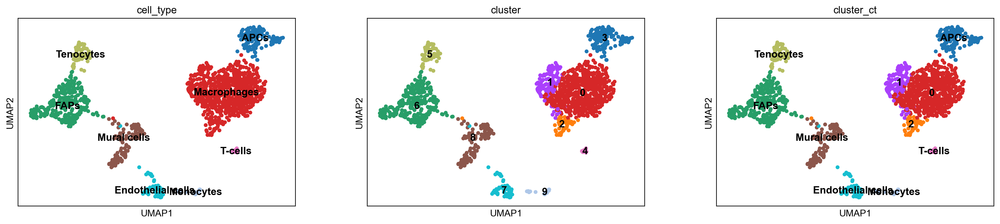

In [5]:
sc.pl.umap(adata, color=['cell_type', 'cluster', 'cluster_ct'], legend_loc='on data')

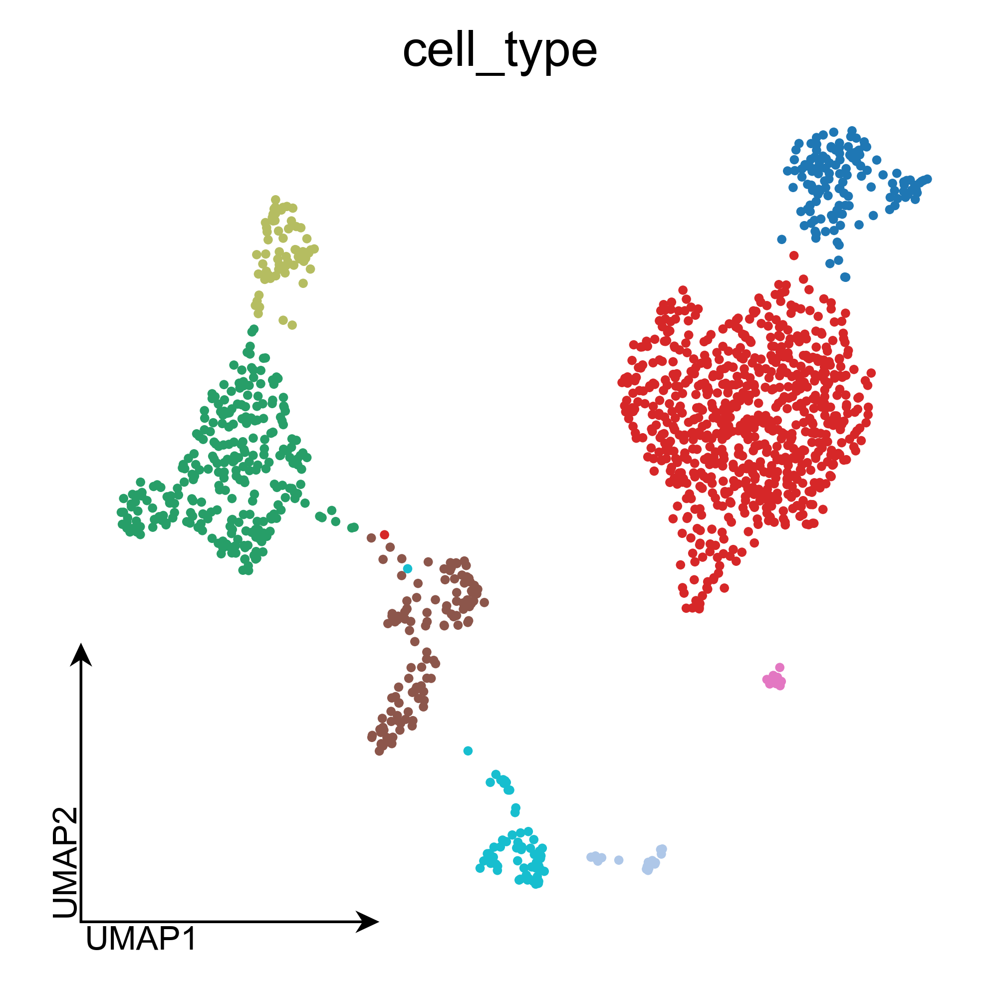

In [6]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata, 'cell_type', size=dotsize, alpha=alpha, fontsize=fontsize, fig_dir=fig_dir, legend_loc='upper_right')

In [7]:
adata_m2 = adata[adata.obs['cell_type'] == 'Macrophages']

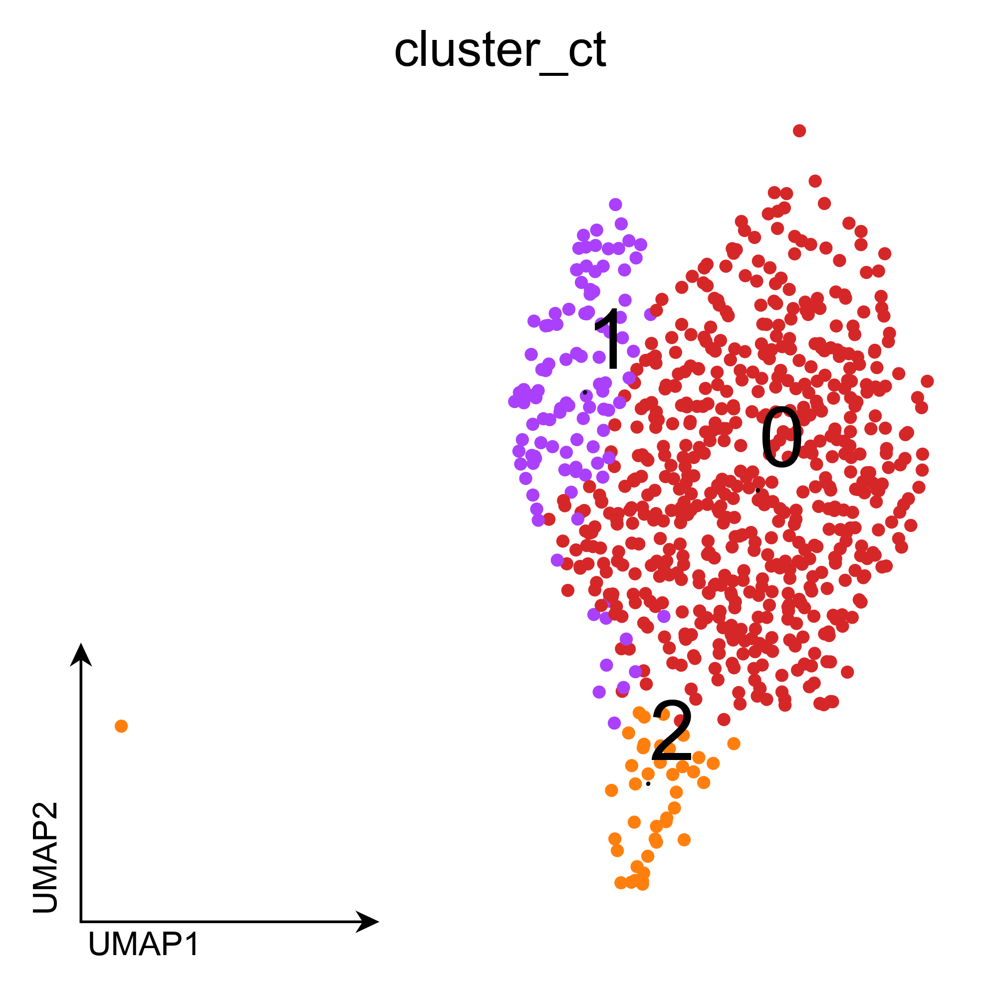

In [8]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata_m2, 'cluster_ct', size=40, fontsize=20, fig_dir=fig_dir)

In [9]:
adata.uns['cluster_colors']

array(['#d62728', '#aa40fc', '#ff7f0e', '#1f77b4', '#e377c2', '#b5bd61',
       '#279e68', '#17becf', '#8c564b', '#aec7e8'], dtype=object)

In [10]:
adata.uns['tdtomato_colors']

array(['#64BF73', '#E52320'], dtype=object)

In [11]:
adata.uns['tdtomato_colors'] = ['#64BF73', '#D81B60']

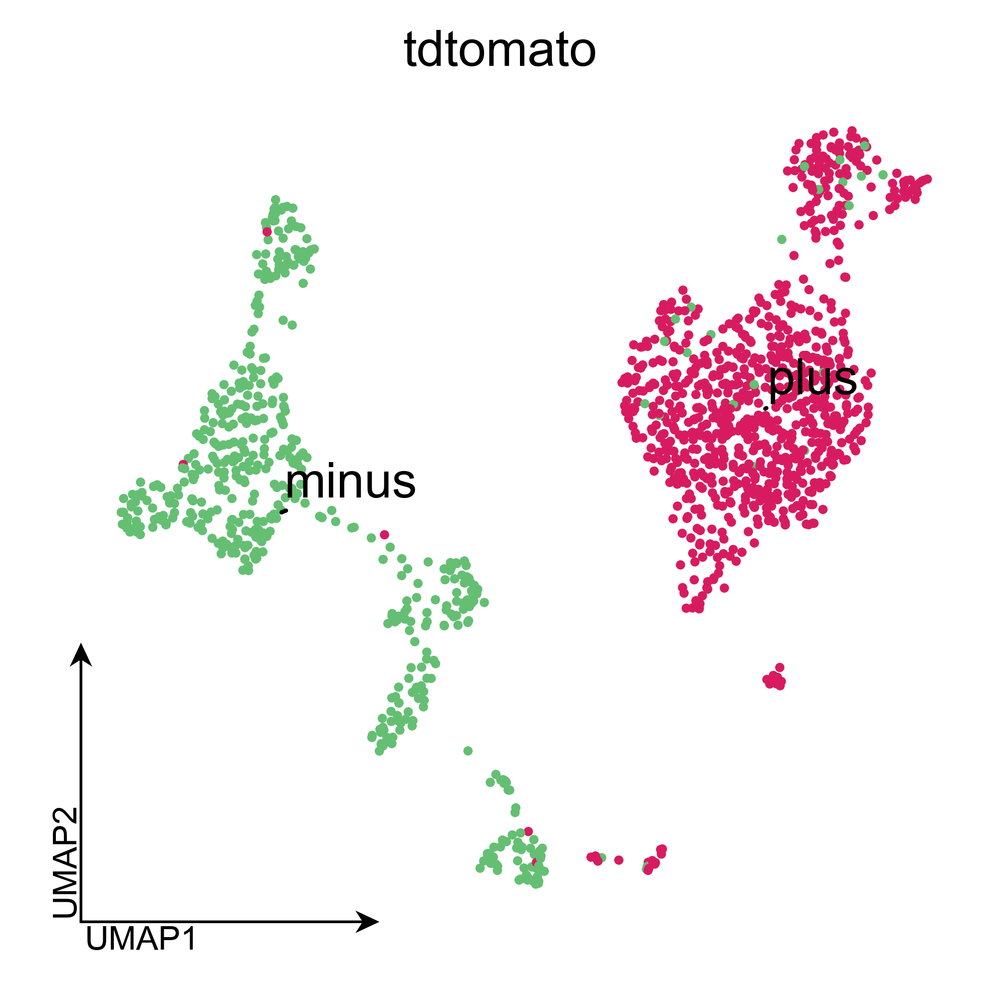

In [12]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata, 'tdtomato', size=dotsize, alpha=alpha, fontsize=fontsize, fig_dir=fig_dir)

Sort cells so that healthy are plotted on top with darker color

In [13]:
adata_sorted = adata[np.argsort(adata.obs['ischemia'], axis=1)]

In [14]:
adata_sorted.uns['ischemia_colors']

array(['#D56B12', '#B4B4B4'], dtype=object)

In [15]:
adata_sorted.uns['ischemia_colors'][1] = '#4d4d4d'#'#666666'

In [16]:
sizes = [10 if ischemia=='D21' else 20 for ischemia in adata_sorted.obs['ischemia']]

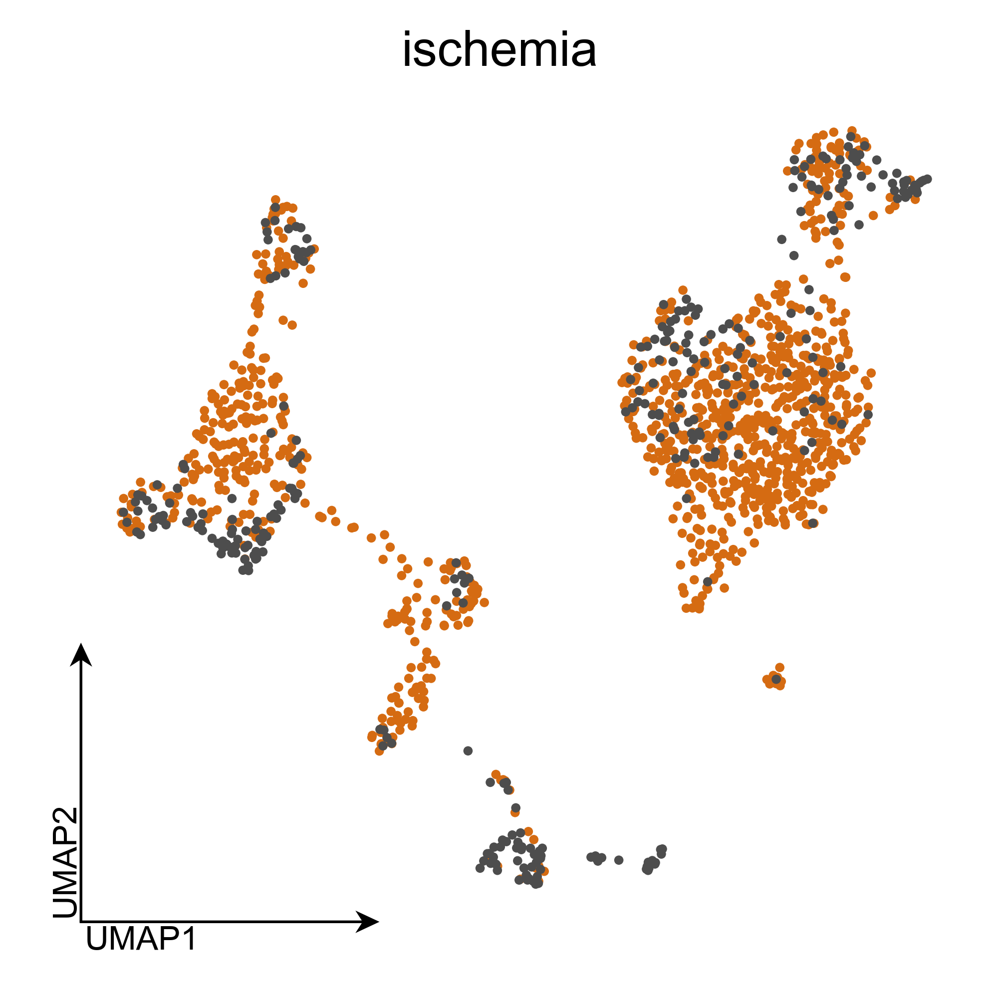

In [17]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata_sorted, 'ischemia', size=dotsize, alpha=alpha, fontsize=fontsize, legend_loc='upper_right', fig_dir=fig_dir)

Show D21 only since that's what's discussed in the paper? Problem is that since D21 is similar to cell type plots, this is somehow duplicated information. And poorly visualized. Plus there is too few healthy cells

In [18]:
adata_d21 = adata[adata.obs['ischemia'] == 'D21']
adata_healthy = adata[adata.obs['ischemia'] != 'D21']

In [19]:
#with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
#    plot_umap(adata_d21, 'cluster_ct', alpha=alpha, fontsize=fontsize, size=dotsize)

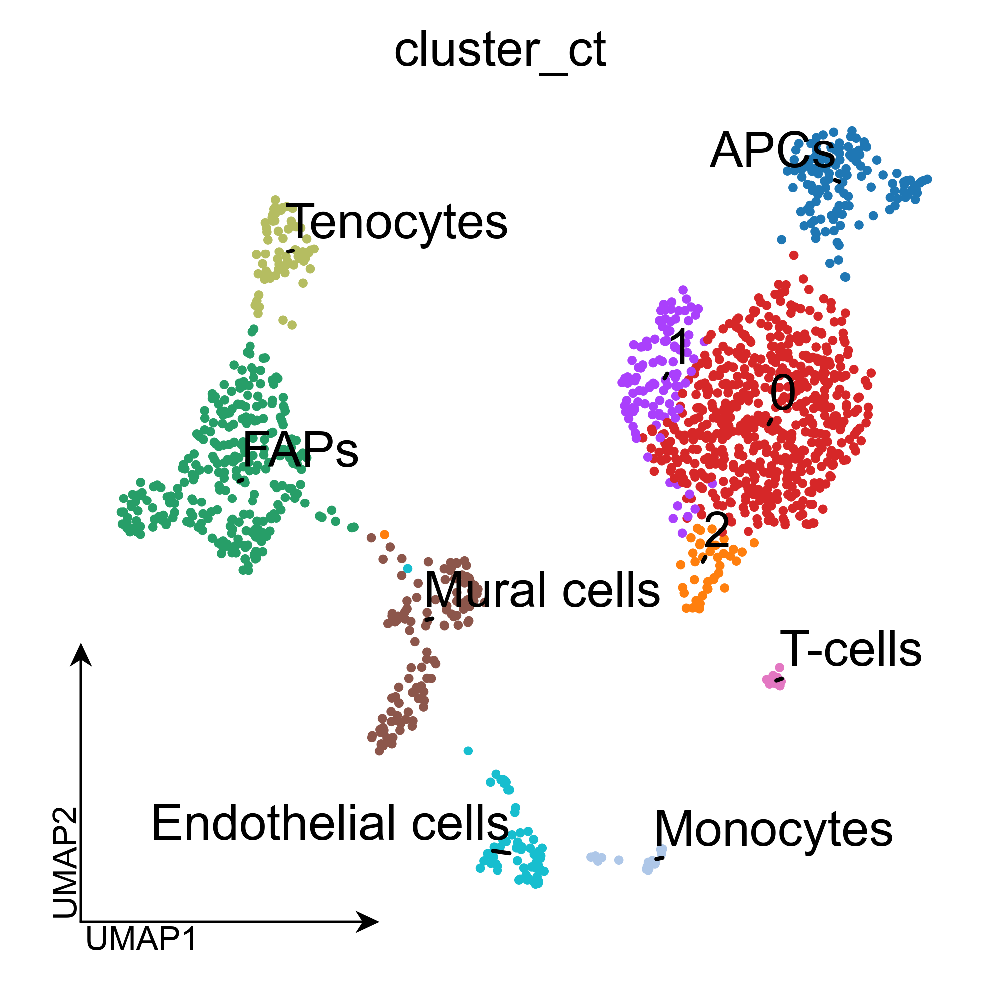

In [20]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata, 'cluster_ct', size=dotsize, fig_dir=fig_dir)

### Save & read

In [21]:
adata.write(h5ad_dir + 'adata.h5ad')

In [22]:
adata = sc.read(h5ad_dir + 'adata.h5ad', cache=True)

## Cell proportions

In [23]:
healthy_plot_pivot = adata_healthy.obs.groupby('tdtomato')['cluster_ct'].value_counts(normalize=True).mul(100).rename('percent').\
                             reset_index().pivot(columns='cluster_ct', index='tdtomato').fillna(0)
d21_plot_pivot = adata_d21.obs.groupby('tdtomato')['cluster_ct'].value_counts(normalize=True).mul(100).rename('percent').\
                           reset_index().pivot(columns='cluster_ct', index='tdtomato').fillna(0)

In [24]:
adata_healthy.obs['cluster_ct'].cat.categories

Index(['APCs', '0', '1', '2', 'Monocytes', 'T-cells', 'Tenocytes', 'FAPs',
       'Mural cells', 'Endothelial cells'],
      dtype='object')

In [25]:
healthy_plot_pivot

percent                                                      \
cluster_ct       APCs          0          1         2 Monocytes   T-cells   
tdtomato                                                                    
minus        5.084746   2.824859   3.389831  0.000000  2.259887  0.000000   
plus        29.729730  34.459459  22.972973  0.675676  9.459459  0.675676   

                                                                
cluster_ct  Tenocytes       FAPs Mural cells Endothelial cells  
tdtomato                                                        
minus       10.734463  43.502825    7.344633         24.858757  
plus         0.675676   0.675676    0.000000          0.675676

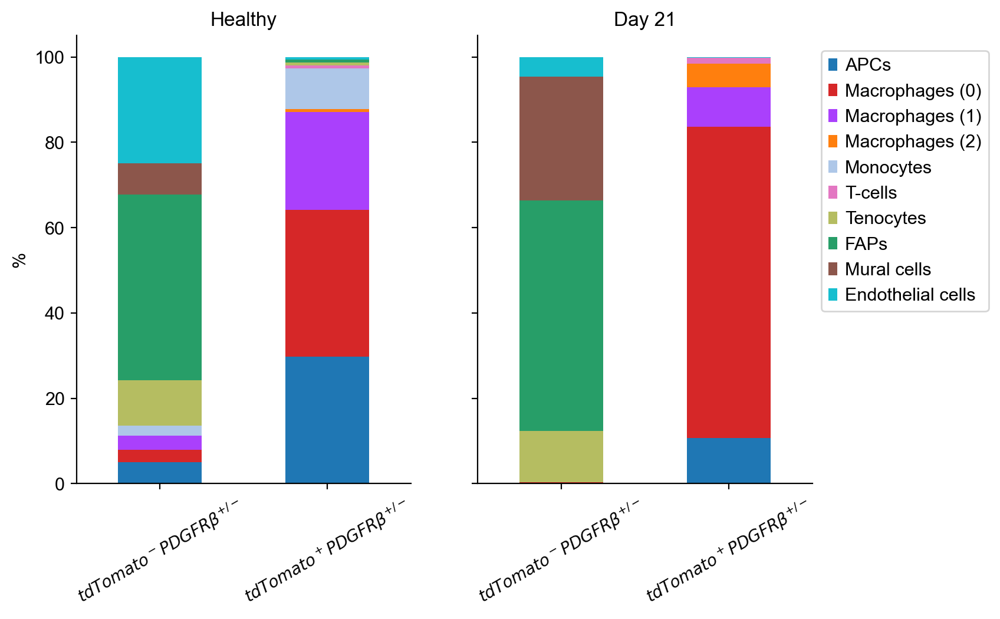

In [26]:
fig, axes = plt.subplots(1, 2, figsize=(8, 5), sharex=True, sharey=True)
healthy_plot_pivot.plot(kind='bar', stacked=True, color=adata_healthy.uns['cluster_ct_colors'], 
                        legend=False, ax=axes[0], title='Healthy')
d21_plot_pivot.plot(kind='bar', stacked=True, color=adata_d21.uns['cluster_ct_colors'], 
                    legend=False, ax=axes[1], title='Day 21')
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)
axes[0].set_ylabel('%')
axes[0].set_xlabel('')
axes[0].set_xticklabels([r'$tdTomato^-PDGFR\beta^{+/-}$', r'$tdTomato^+PDGFR\beta^{+/-}$'], rotation=30, size=10)


axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)
axes[1].set_xlabel('')
axes[1].set_xticklabels([r'$tdTomato^-PDGFR\beta^{+/-}$', r'$tdTomato^+PDGFR\beta^{+/-}$'], rotation=30, size=10)

#handles0, labels0 = axes[0].get_legend_handles_labels()
handles, labels = axes[0].get_legend_handles_labels()
labels = adata_healthy.obs['cluster_ct'].cat.categories
labels = labels.str.replace('(\d+)', 'Macrophages (\\1)')
fig.legend(handles, labels,  title='', bbox_to_anchor=(0.96,0.9), loc='upper left')
fig.savefig(fig_dir + 'cell_proportions.pdf', bbox_inches='tight')


## Marker genes

In [27]:
marker_genes_dict = {
    'APCs': ['Itgax', 'H2-DMb1', 'H2-DMb2'], 
    'Macrophages': ['Adgre1', 'Csf1r', 'Mrc1'],
    'Monocytes': ['Itgal', 'Itgb2'],
    #'0': ['Cx3cr1', 'Adgre1'], 
    #'1': ['Lyve1', 'Cbr2', 'Mgl2'], 
    #'2': ['Ttn', 'Sfi1', 'Pdgfrb'], 
    'T-cells': ['Ccl5', 'Nkg7'], 
    'Tenocytes': ['Scx', 'Tnmd', 'Fmod'], 
    'FAPs': ['Pdgfra', 'Lum', 'Col3a1'],
    'Mural cells': ['Notch3', 'Rgs5', 'Pdgfrb'],
    'Endothelial cells': ['Pecam1', 'Kdr', 'Cdh5']
    }

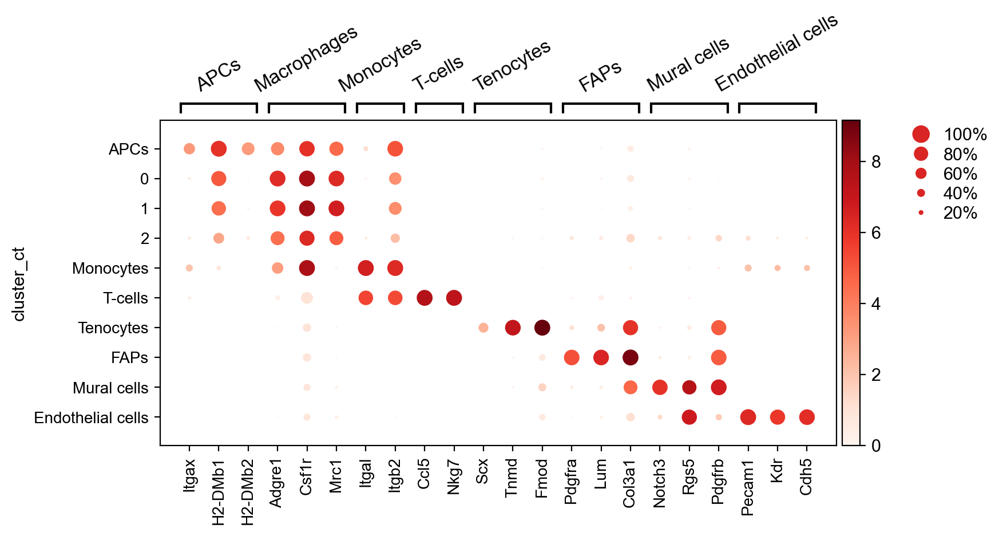

GridSpec(2, 5, height_ratios=[0.5, 10], width_ratios=[7.699999999999999, 0, 0.2, 0.5, 0.25])

In [34]:
sc.pl.dotplot(adata, marker_genes_dict, groupby='cluster_ct', var_group_rotation=30)

In [35]:
marker_genes_dict_empty = {
    '': ['Itgax', 'H2-DMb1', 'H2-DMb2'],
    ' ': ['Adgre1', 'Csf1r', 'Mrc1'],
    '  ': ['Itgal', 'Itgb2'],
    #'0': ['Cx3cr1', 'Adgre1'], 
    #'1': ['Lyve1', 'Cbr2', 'Mgl2'], 
    #'2': ['Ttn', 'Sfi1', 'Pdgfrb'], 
    '   ': ['Ccl5', 'Nkg7'], 
    '    ': ['Scx', 'Tnmd', 'Fmod'], 
    '     ': ['Pdgfra', 'Lum', 'Col3a1'],
    '      ': ['Notch3', 'Rgs5', 'Pdgfrb'],
    '       ': ['Pecam1', 'Kdr', 'Cdh5']
    }

AttributeError: 'PathCollection' object has no property 'return_fig'

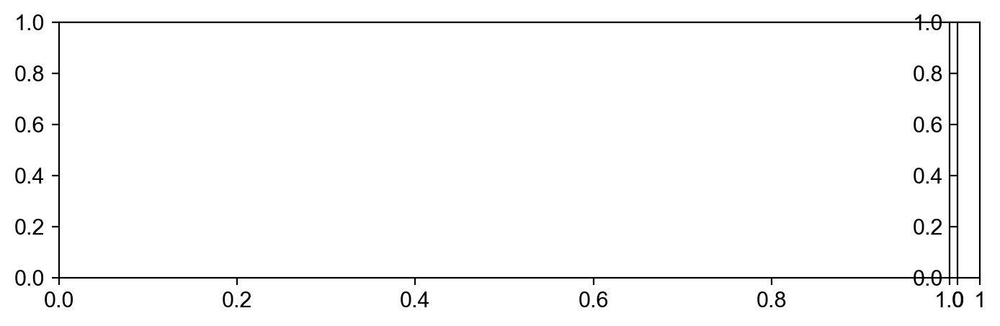

In [50]:
dp = sc.pl.dotplot(adata, marker_genes_dict_empty, groupby='cell_type', figsize=(9,2.5), return_fig=True)

In [46]:
dp.add_totals(color=adata.uns['cell_type_colors']).savefig(fig_dir + 'markers_dotplot.pdf', dpi=300, ext='pdf')

AttributeError: 'GridSpec' object has no attribute 'add_totals'

In [42]:
dp.add_totals(color=adata.uns['cell_type_colors']).style(color_on='square', cmap='binary').show()

AttributeError: 'GridSpec' object has no attribute 'add_totals'

In [43]:
binary_cm = cm.get_cmap('binary', 512)
new_binary_cm = ListedColormap(binary_cm(np.linspace(0, 0.8, 256)))

In [44]:
dp.add_totals(color=adata.uns['cell_type_colors']).style(color_on='square', cmap=new_binary_cm).\
savefig(fig_dir + 'markers_dotplot.binary.pdf', dpi=300, ext='pdf')

AttributeError: 'GridSpec' object has no attribute 'add_totals'

In [51]:
plt.rcParams["image.cmap"]

'RdBu_r'

In [52]:
marker_genes = [item for sublist in marker_genes_dict.values() for item in sublist]

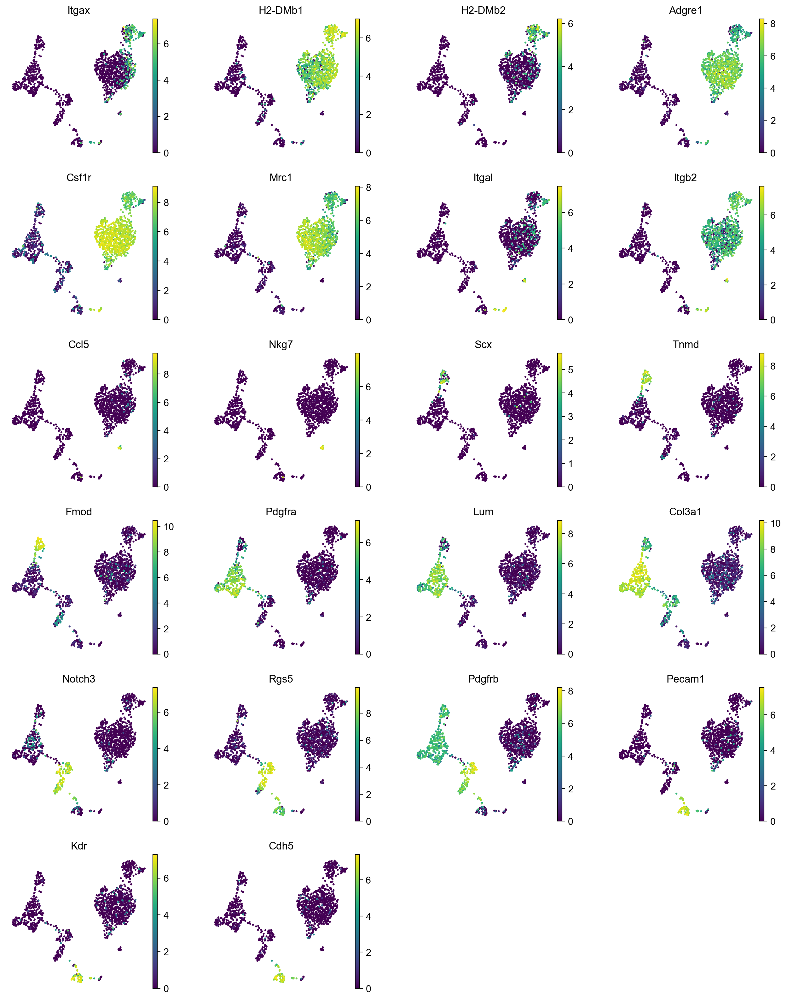

In [53]:
with plt.rc_context({'figure.figsize': (3, 3)}):
    umap_makers = sc.pl.umap(adata, color=marker_genes, alpha=alpha, size=dotsize, color_map='viridis', 
                             frameon=False, ncols=4, return_fig=True)
    umap_makers.savefig(fig_dir + 'umap_markers.pdf', dpi=300, ext='pdf')

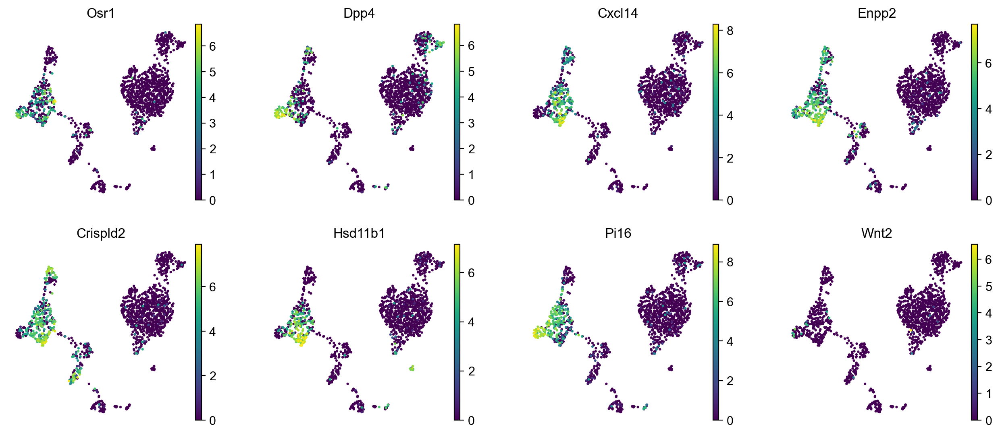

In [54]:
faps_genes = ['Osr1', 'Dpp4', 'Cxcl14', 'Enpp2', 'Crispld2', 'Hsd11b1', 'Pi16', 'Wnt2']
with plt.rc_context({'figure.figsize': (3, 3)}):
    umap_faps = sc.pl.umap(adata, color=faps_genes, alpha=alpha, size=dotsize, color_map='viridis', frameon=False,  ncols=4, return_fig=True)
    umap_faps.savefig(fig_dir + 'umap_faps_genes.pdf', dpi=300, ext='pdf')

## Mergeing unspliced

Loom file obtained by running velocyto masking for repeats. 
`velocyto run-smartseq2 -o mapping/velocyto -e macro_rm -m data/mm10_rmsk.gtf mapping/star/*.sorted.bam
data/gencode.vM25.primary_assembly.annotation.gtf`

In [56]:
ldata = scv.read(data_dir + 'macro_rm.loom')

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [57]:
ldata

AnnData object with n_obs × n_vars = 1536 × 55487
    var: 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    layers: 'matrix', 'ambiguous', 'spanning', 'spliced', 'unspliced'

In [58]:
ldata.obs.head()

""
macro_rm:SS2_19_276_A1.sorted.bam
macro_rm:SS2_19_276_A2.sorted.bam
macro_rm:SS2_19_276_A3.sorted.bam
macro_rm:SS2_19_276_A4.sorted.bam
macro_rm:SS2_19_276_A5.sorted.bam


In [59]:
ldata.obs = ldata.obs.set_index(ldata.obs.index.str.replace('macro_rm:', '').str.replace('.sorted.bam', ''))

In [60]:
ldata.obs.head()

""
SS2_19_276_A1
SS2_19_276_A2
SS2_19_276_A3
SS2_19_276_A4
SS2_19_276_A5


In [61]:
adata.obsm['raw'].shape

(1425, 38178)

In [62]:
sub_uns = {k: adata.uns[k] for k in ['cell_type_colors', 'ischemia_colors', 'cluster_colors', 'cluster_ct_colors', 'tdtomato_colors']}

In [63]:
sub_obs = adata.obs[['total_counts', 'n_genes', 'sortdate', 'plate', 'well', 'cell_identity', 
                     'ischemia', 'sex', 'tdtomato', 'pct_counts_mt', 'percent_chrY', 'XIST-counts', 
                     'S_score', 'G2M_score', 'phase', 'doublet_scores', 'cell_type', 'cluster', 
                     'cluster_ct']]

In [64]:
sub_obsm ={k: adata.obsm[k] for k in ['X_pca', 'X_umap']} 

In [65]:
adata_raw = sc.AnnData(X=adata.obsm['raw'], obs=sub_obs, var=adata.raw.var, uns=sub_uns, obsm=sub_obsm, obsp=adata.obsp)

In [66]:
adata_raw.layers['raw'] = adata_raw.X

In [67]:
adata_raw = scv.utils.merge(adata_raw, ldata)

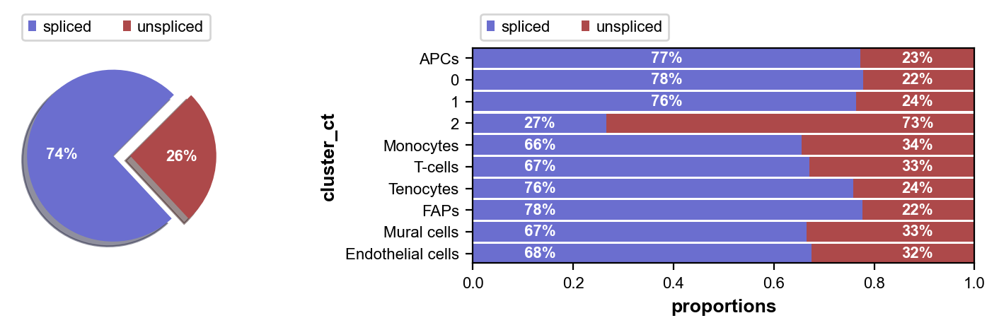

In [68]:
scv.pl.proportions(adata_raw, groupby='cluster_ct')

In [69]:
''' Copied from scv.pl.proportions source code and modified
'''

import warnings
from numpy import ndarray
from scipy.sparse import issparse, spmatrix
from typing import Optional, Union
def sum(a: Union[ndarray, spmatrix], axis: Optional[int] = None) -> ndarray:
    """Sum array elements over a given axis.
    Arguments
    ---------
    a
        Elements to sum.
    axis
        Axis along which to sum elements. If `None`, all elements will be summed.
        Defaults to `None`.
    Returns
    -------
    ndarray
        Sum of array along given axis.
    """

    if a.ndim == 1:
        axis = 0

    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        return a.sum(axis=axis).A1 if issparse(a) else a.sum(axis=axis)

In [70]:
layers = None
use_raw=True
if layers is None:
    layers = ["spliced", "unspliced", "ambigious"]
layers_keys = [key for key in layers if key in adata_raw.layers.keys()]
counts_layers = [sum(adata_raw.layers[key], axis=1) for key in layers_keys]

if use_raw:
    ikey, obs = "initial_size_", adata_raw.obs
    counts_layers = [
        obs[ikey + layer_key] if ikey + layer_key in obs.keys() else c
        for layer_key, c in zip(layers_keys, counts_layers)
    ]
counts_total = np.sum(counts_layers, 0)
counts_total += counts_total == 0
counts_layers = np.array([counts / counts_total for counts in counts_layers])


In [71]:
means = np.mean(counts_layers, axis=1)
medians = np.median(counts_layers, axis=1)
means, medians

(array([0.74427431, 0.25572569]), array([0.78448706, 0.21551294]))

[<BarContainer object of 10 artists>, <BarContainer object of 10 artists>, <matplotlib.lines.Line2D object at 0x7fd7cd0a1c18>]


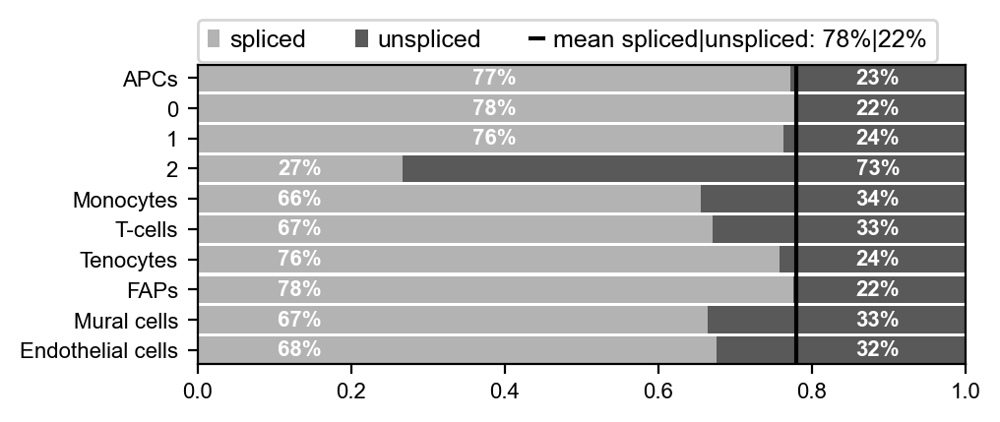

In [72]:
add_labels_bar=True
fontsize=10
gspec = plt.GridSpec(1, 1, plt.figure(None, figsize=(5,2), dpi=100))
#colors = plt.get_cmap("tab20b")(np.linspace(0.10, 0.65, len(layers_keys)))
colors = plt.get_cmap("binary")(np.linspace(0.30, 0.65, len(layers_keys)))
groupby = 'cluster_ct'
if groupby is not None and groupby in adata_raw.obs.keys():
    counts_groups = dict()
    for cluster in adata_raw.obs[groupby].cat.categories:
        counts_groups[cluster] = np.mean(
            counts_layers[:, adata_raw.obs[groupby] == cluster], axis=1
        )

    labels = list(counts_groups.keys())
    data = np.array(list(counts_groups.values()))
    data_cum = data.cumsum(axis=1)

    ax2 = plt.subplot(gspec[0])
    for i, (colname, color) in enumerate(zip(layers_keys, colors)):
        starts, widths = data_cum[:, i] - data[:, i], data[:, i]
        xpos = starts + widths / 2
        curr_xpos = xpos[0]
        for i, (x, w) in enumerate(zip(xpos, widths)):
            if not (x - w / 2 + 0.05 < curr_xpos < x + w / 2 - 0.05):
                curr_xpos = x
            xpos[i] = curr_xpos

        ax2.barh(
            labels, widths, left=starts, height=0.9, label=colname, color=color
        )

        if add_labels_bar:
            r, g, b, _ = color
            text_color = "white" if r * g * b < 0.5 else "darkgrey"
            for y, (x, c) in enumerate(zip(xpos, widths)):
                ax2.text(
                    x,
                    y,
                    f"{(c * 100):.0f}%",
                    ha="center",
                    va="center",
                    color=text_color,
                    fontsize=8,
                    fontweight="bold",
                )

    #ax2.add_artist(first_legend)
    ax2.invert_yaxis()
    ax2.set_xlim(0, np.nansum(data, axis=1).max())
    ax2.margins(0)
    vline = ax2.axvline(int(math.floor(medians[0]*100))/100, linestyle='-', color='k', 
                        label='mean spliced|unspliced: %d%%|%d%%' %(math.floor(medians[0]*100), math.ceil(medians[1]*100)))
    #ax2.legend(handles=[first_legend, vline])
    ax2.legend(
        ncol=len(layers_keys)+1,
        bbox_to_anchor=(0, 1),
        borderaxespad=0,
        loc="lower left",
        fontsize=fontsize,
    )

    handles, labels = ax2.get_legend_handles_labels()
    new_order = [1, 2, 0]
    handles = [handles[i] for i in new_order]
    labels = [labels[i] for i in new_order]
    print(handles)
    ax2.legend(handles=handles, labels=labels, ncol=3, borderaxespad=0, loc='lower left', bbox_to_anchor=(0, 1.01), fontsize=9)  

    #ax2.set_xlabel("proportions", fontweight="bold", fontsize=fontsize * 1.2)
    #ax2.set_ylabel(groupby, fontweight="bold", fontsize=fontsize * 1.2)
    ax2.tick_params(axis="both", which="major", labelsize=8)
    
    fig = ax2.get_figure()
    fig.savefig(fig_dir + 'proportions.pdf', bbox_inches='tight')

In [73]:
counts_s_per_cell_raw = scv.utils.sum_var(adata_raw.layers['spliced'])
counts_u_per_cell_raw = scv.utils.sum_var(adata_raw.layers['unspliced'])
fractions_u_per_cell_raw = counts_u_per_cell_raw / (counts_s_per_cell_raw + counts_u_per_cell_raw)

In [74]:
adata_raw.obs['counts_spliced'] = counts_s_per_cell_raw
adata_raw.obs['counts_unspliced'] = counts_u_per_cell_raw
adata_raw.obs['counts_spliced_unspliced'] = counts_s_per_cell_raw + counts_u_per_cell_raw
adata_raw.obs['fractions_unspliced'] = fractions_u_per_cell_raw

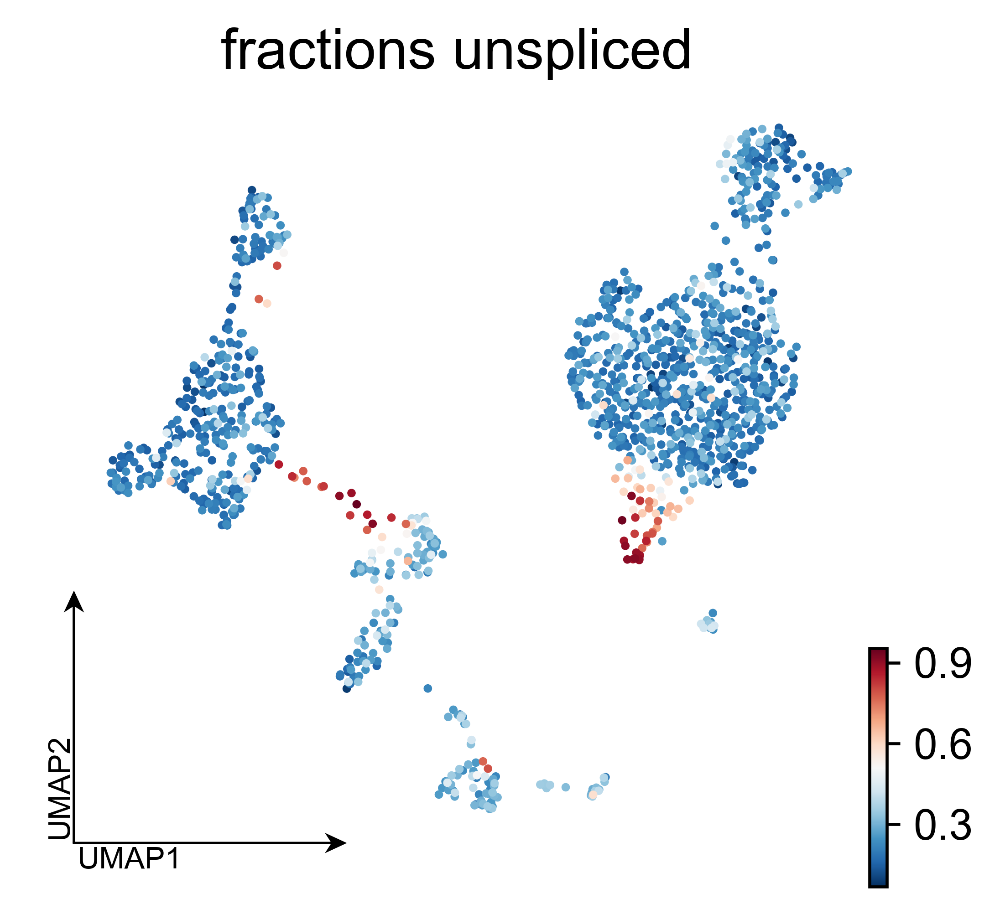

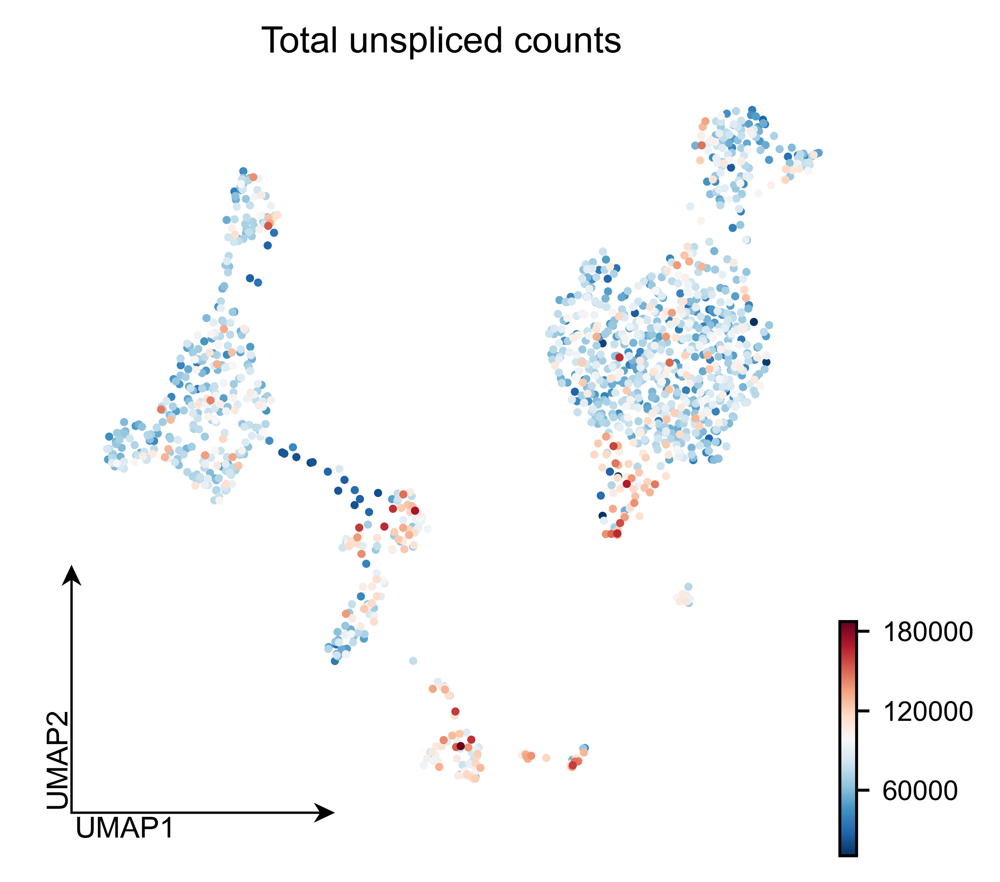

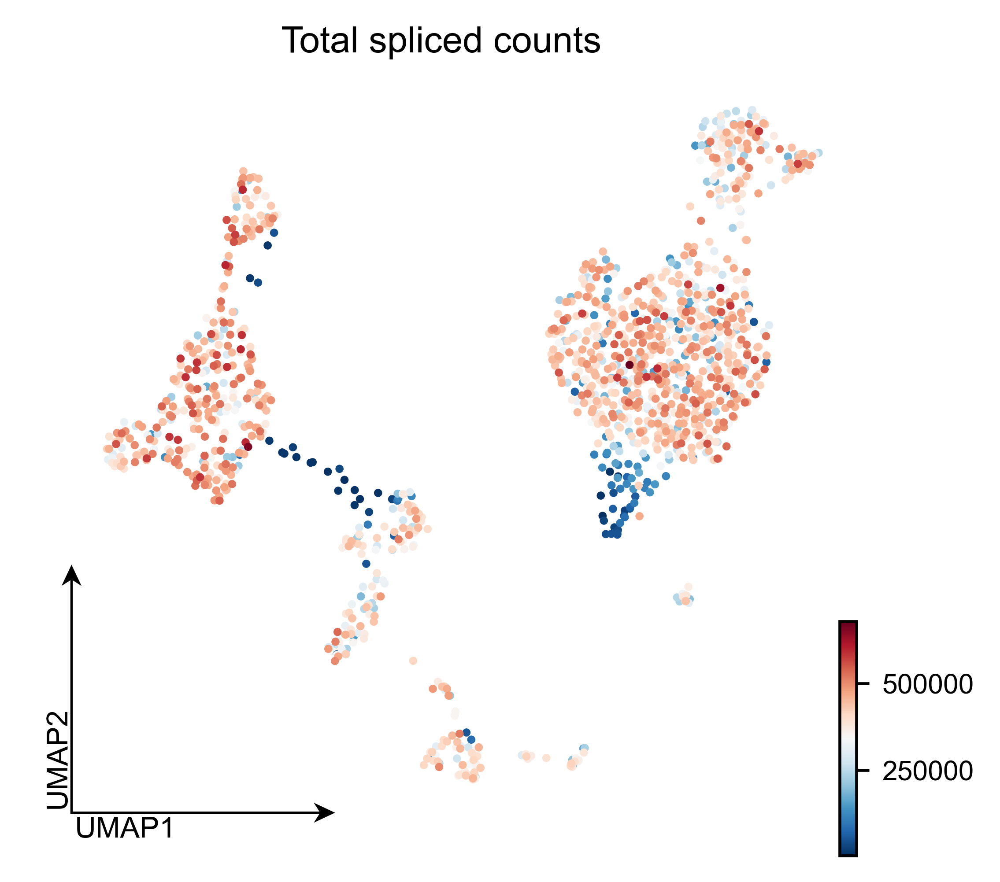

In [75]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap_scv_scatter(adata_raw, 'fractions_unspliced', alpha=1, size=dotsize, fontsize=fontsize+5, fig_dir=fig_dir)
    plot_umap_scv_scatter(adata_raw, 'counts_unspliced', alpha=1, size=dotsize, fontsize=fontsize, title='Total unspliced counts', fig_dir=fig_dir)
    plot_umap_scv_scatter(adata_raw, 'total_counts', alpha=1, size=dotsize, fontsize=fontsize, title='Total spliced counts', fig_dir=fig_dir)

### Save & read

In [ ]:
adata_raw.write(h5ad_dir + 'adata.unspliced.raw.h5ad')

In [ ]:
adata_raw = sc.read(h5ad_dir + 'adata.unspliced.raw.h5ad', cache=True)

## D21 only

In [ ]:
adata_d21 = adata[adata.obs['ischemia'] == 'D21']

In [ ]:
import re
def mouse_genes(genes_str):
    genes = []
    for g in genes_str.split(','):
        gene = g.strip().capitalize()
        if re.search('-', gene):
            gene = '-'.join([a.capitalize() for a in gene.split('-')])
        genes.append(gene)
    return genes

In [ ]:
macrophage_genes = mouse_genes('CD74, H2-Ab1, Csf1r, Anxa2, Junb, CD36, Ptprc, Adgre1, Mrc1, CD14,  Itgam, CD86, TLR2, TLR7, Cx3cr1')
mural_cell_genes = mouse_genes('Ebf1, PDGFRB, Adamts2, Sema5a, CACNA1C, Ano1, Myh11,  RGS5, Cspg4, Acta2, Des, Nes')
genes={'Known macrophage associated': macrophage_genes,
       'Known mural cell associated': mural_cell_genes}

### dotplot

In [ ]:
dp_d21 = sc.pl.dotplot(adata_d21, genes, groupby='cluster_ct', var_group_rotation=0, 
                       figsize=(10.5, 2.8), return_fig=True)

In [ ]:
dp_d21.height

In [ ]:
dp_d21.add_totals(color=adata.uns['cell_type_colors']).style(color_on='square', cmap=new_binary_cm).\
savefig(fig_dir + 'd21_dotplot.binary.pdf', dpi=300, ext='pdf')

### PAGA

In [ ]:
sc.tl.draw_graph(adata_d21)

In [ ]:
sc.tl.paga(adata_d21, groups='cluster')

In [ ]:
sc.pl.paga(adata_d21, color=['cell_type', 'Cx3cr1', 'Pdgfrb', 'tdtomato'])

In [ ]:
sc.tl.draw_graph(adata_d21, init_pos='paga')
sc.pl.draw_graph(adata_d21, color=['cell_type', 'cluster', 'Cx3cr1', 'Pdgfrb', 'Vcam1', 'tdtomato', 'ischemia'], legend_loc='on data' )

In [ ]:
adata_d21.uns['iroot'] = np.flatnonzero(adata_d21.obs['cluster_ct'] == '0')[0]
sc.tl.diffmap(adata_d21)
sc.tl.dpt(adata_d21)
with plt.rc_context({"figure.figsize": (3.5, 1.6), 'figure.frameon':False}):
    sc.pl.draw_graph(adata_d21, color=['cluster_ct', 'dpt_pseudotime'], legend_loc='on data', color_map='viridis',
                 frameon=False, size=20, legend_fontsize='x-small', legend_fontweight='light', layout='fa')



Since endothelial cells are just lying outside of everything, decided to remove them from display

In [ ]:
adata_d21.obs['pseudotime'] = adata_d21.obs['dpt_pseudotime']

In [ ]:
adata_d21_no_ec = adata_d21[adata_d21.obs['cluster_ct'] != 'Endothelial cells']
with plt.rc_context({"figure.figsize": (3.5, 1.6), 'figure.frameon':False}):
    graph_fa = sc.pl.draw_graph(adata_d21_no_ec, color=['cluster_ct', 'pseudotime'], legend_loc='on data', color_map='viridis',
                 frameon=False, size=20, legend_fontsize='small', legend_fontweight='light', layout='fa', return_fig=True)
    graph_fa.savefig(fig_dir + 'draw_graph_fa.pdf', bbox_inches='tight')

In [ ]:
viridis_cm = cm.get_cmap('viridis', 512)
new_viridis_cm = ListedColormap(viridis_cm(np.linspace(0, 0.8, 256)))

In [ ]:
plt.rc_context({"figure.figsize": (7, 3.5), "figure.dpi": 300})
plt.rcParams["figure.figsize"] = [7, 5]
path=[0,2,8]
#gene_names=['Cx3cr1', 'Lyve1', 'Lama1', 'Fbn2', 'Ttn', 'Tln2', 'Pdgfrb']
descr='Macrophages to pericytes'
fig = plt.figure()
axes, data = sc.pl.paga_path(
        adata_d21, path, macrophage_genes + mural_cell_genes,
        use_raw=True,
        show_node_names=False,
        ytick_fontsize=10,
        title_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['pseudotime'],
        show_yticks=True,
        show_colorbar=True,
        show=False,
        color_map=new_binary_cm, #'turbo',#'binary',
        groups_key='cluster',
        color_maps_annotations={'pseudotime': new_viridis_cm},
        title='{} path'.format(descr),
        return_data=True) #save='.pdf'
#data.to_csv('./data/results/paga_path_{}.csv'.format(descr))

In [ ]:
linewidth=0.5
n_cells = np.sum(adata_d21.obs['cluster'].isin(map(str,path)))
scale = (axes.get_xlim()[1] - axes.get_xlim()[0])/ float(n_cells)
cluster0_size = adata_d21[adata_d21.obs['cluster'] == '0'].shape[0]
cluster2_size = adata_d21[adata_d21.obs['cluster'] == '2'].shape[0]
axes.axvline(x=(cluster0_size) * scale, linewidth=linewidth, color='w')
axes.axvline(x=(cluster0_size + cluster2_size - 0.5)*scale, linewidth=linewidth, color='w')

In [ ]:
fig

In [ ]:
fig.savefig(fig_dir + 'paga_path.binary.pdf')

## Adding unspliced counts on top of FC counts

In [ ]:
adata_w_unspliced = adata_raw.copy()
adata_w_unspliced.X = adata_raw.X + adata_raw.layers['unspliced']

In [ ]:
sc.pp.normalize_per_cell(adata_w_unspliced)
sc.pp.log1p(adata_w_unspliced)

# Store normalized counts in the raw slot.
# We will subset adata.X for variable genes, but want to keep all genes matrix as well.
adata_w_unspliced.raw = adata_w_unspliced

In [ ]:
adata_w_unspliced_d21 = adata_w_unspliced[adata_w_unspliced.obs['ischemia'] == 'D21']
adata_w_unspliced_d21.shape

In [ ]:
adata_raw_d21 = adata_raw[adata_raw.obs['ischemia'] == 'D21']

### Dotplot

In [ ]:
mat = adata_raw.layers['unspliced']/(adata_raw.layers['raw'] + adata_raw.layers['unspliced'] + 1e-12)
mat_df = pd.DataFrame(mat, columns=adata_raw.var_names)
mat_df['cluster_ct'] = adata_raw.obs['cluster_ct'].values

In [ ]:
mat_df_mean = mat_df.groupby('cluster_ct').mean()

In [ ]:
def star_plus_by_avg_fraction_u(adata, feature='cluster_ct'):
    ''' Return the star, plus coordinates
    First get an updated fraction_u_per_gene_fc based on
    the same cutoff as in the earlier enrichment analysis
    '''
    unspliced_df = pd.DataFrame({'gene': adata.var_names})
    for cluster in adata.obs[feature].cat.categories:
        counts_s_per_gene_fc = scv.utils.sum_obs(adata[adata.obs[feature]==cluster].X)
        counts_u_per_gene = scv.utils.sum_obs(adata[adata.obs[feature]==cluster].layers['unspliced'])
        fractions_u_per_gene_fc = counts_u_per_gene / (counts_s_per_gene_fc + counts_u_per_gene)
        cluster_size = adata[adata.obs[feature]==cluster].shape[0]
        percent_cells_s = scv.utils.sum_obs(adata[adata.obs[feature]==cluster].layers['spliced']>0)/cluster_size
        percent_cells_s_fc = scv.utils.sum_obs(adata[adata.obs[feature]==cluster].X>0)/cluster_size
        percent_cells_u = scv.utils.sum_obs(adata[adata.obs[feature]==cluster].layers['unspliced']>0)/cluster_size
        avg_fractions_u = mat_df_mean.loc[cluster, :]
        
        avg_fractions_u_upadated = []
        for avg_fraction_u, fraction_u in zip(avg_fractions_u, fractions_u_per_gene_fc):
            if avg_fraction_u >= 0.3:
                avg_fractions_u_upadated.append(fraction_u)
            else:
                avg_fractions_u_upadated.append(0)
        unspliced_df[cluster] = avg_fractions_u_upadated

    unspliced_df.set_index('gene', inplace=True)
    unspliced_df = unspliced_df.transpose()
    
    xs_big, ys_big, xs_medium, ys_medium = [], [], [], []
    for i, gene in enumerate(macrophage_genes + mural_cell_genes):
        for j, p in enumerate(unspliced_df.loc[:, gene]):
            if p >= 0.8:
                xs_big.append(i + 0.5)
                ys_big.append(j + 0.5)
            elif p>=0.4:
                xs_medium.append(i + 0.5)
                ys_medium.append(j + 0.5)
    
    return(unspliced_df, xs_big, ys_big, xs_medium, ys_medium)


In [ ]:
unspliced_df, xs_big, ys_big, xs_medium, ys_medium = star_plus_by_avg_fraction_u(adata_raw_d21)
dp_d21_w_unspliced = sc.pl.dotplot(adata_w_unspliced_d21, genes, groupby='cluster_ct', var_group_rotation=0, 
                                   figsize=(10.5, 2.8), return_fig=True)
dp_d21_w_unspliced.get_axes()['mainplot_ax'].plot(xs_big, ys_big, 'w*', xs_medium, ys_medium, 'w+')

In [ ]:
dp_d21_w_unspliced = sc.pl.dotplot(adata_w_unspliced_d21, genes, groupby='cluster_ct', var_group_rotation=0, 
                                   figsize=(10.5, 2.8), return_fig=True)
ax = dp_d21_w_unspliced.add_totals(color=adata.uns['cell_type_colors']).\
    style(color_on='square', cmap=new_binary_cm).get_axes()['mainplot_ax']

In [ ]:
col_big = ax.scatter(xs_big, ys_big, c='w', marker='*')
col_medium = ax.scatter(xs_medium, ys_medium, c='w', marker='+')

In [ ]:
ax.add_collection(col_big)
ax.add_collection(col_medium)

In [ ]:
ax.get_figure()

In [ ]:
ax.get_figure().savefig(fig_dir + 'd21_dotplot_w_unspliced.binary.pdf', bbox_inches='tight')

### PAGA

In [ ]:
adata_w_unspliced_d21.obs['pseudotime'] = adata_d21.obs['dpt_pseudotime']
adata_w_unspliced_d21.obs['dpt_pseudotime'] = adata_d21.obs['dpt_pseudotime']

In [ ]:
plt.rc_context({"figure.figsize": (7, 3.5), "figure.dpi": 300})
plt.rcParams["figure.figsize"] = [7, 5]
path=[0,2,8]
#gene_names=['Cx3cr1', 'Lyve1', 'Lama1', 'Fbn2', 'Ttn', 'Tln2', 'Pdgfrb']
descr='Macrophages to pericytes'
fig = plt.figure()
axes, data = sc.pl.paga_path(
        adata_w_unspliced_d21, path, macrophage_genes + mural_cell_genes,
        use_raw=True,
        show_node_names=False,
        ytick_fontsize=10,
        title_fontsize=12,
        left_margin=0.15,
        n_avg=50,
        annotations=['pseudotime'],
        show_yticks=True,
        show_colorbar=True,
        show=False,
        color_map=new_binary_cm, #'binary', #'turbo',
        groups_key='cluster',
        color_maps_annotations={'pseudotime': new_viridis_cm},
        title='{} path with unspliced counts'.format(descr),
        return_data=True) #save='.pdf'
#data.to_csv('./data/results/paga_path_{}.csv'.format(descr))

In [ ]:
linewidth=0.5
n_cells = np.sum(adata_w_unspliced_d21.obs['cluster'].isin(map(str,path)))
scale = (axes.get_xlim()[1] - axes.get_xlim()[0])/ float(n_cells)
cluster0_size = adata_w_unspliced_d21[adata_w_unspliced_d21.obs['cluster'] == '0'].shape[0]
cluster2_size = adata_w_unspliced_d21[adata_w_unspliced_d21.obs['cluster'] == '2'].shape[0]
axes.axvline(x=(cluster0_size) * scale, linewidth=linewidth, color='w')
axes.axvline(x=(cluster0_size + cluster2_size - 0.5)*scale, linewidth=linewidth, color='w')

In [ ]:
fig

In [ ]:
fig.savefig(fig_dir + 'paga_path.w_unspliced.binary.pdf')

## DE analysis

In [ ]:
sc.pl.umap(adata_d21, color=['cluster', 'cluster_ct'], legend_loc='on data')

In [ ]:
# keep only protein coding genes in sig list
import pyranges as pr
gtf_file = '../data/gencode.vM25.primary_assembly.annotation.gtf'
genes = pr.read_gtf(gtf_file, as_df = True)
proteins = genes[(genes.gene_type == 'protein_coding') & (genes.Feature == 'gene')]

### 0vs2

In [ ]:
sig_genes_0_vs_2 = rank_and_string(adata_d21, '0', '2', 'cluster', proteins, extra_tag='', save_volcano=False, use_raw=True, 
                    work_dir=csv_dir, method='wilcoxon', n_genes=50, cutoff=0.05)

### 0vs8

In [ ]:
sig_genes_0_vs_8 = rank_and_string(adata_d21, '0', '8', 'cluster', proteins, extra_tag='', save_volcano=False, use_raw=True, 
                    work_dir=csv_dir, method='wilcoxon', n_genes=50, cutoff=0.05)

### 0vs1

In [ ]:
sig_genes_0_vs_1 = rank_and_string(adata_d21, '0', '1', 'cluster', proteins, extra_tag='', save_volcano=False, use_raw=True, 
                    work_dir=csv_dir, method='wilcoxon', n_genes=50, cutoff=0.05)

### 0vs5

In [ ]:
sig_genes_0_vs_5 = rank_and_string(adata_d21, '0', '5', 'cluster', proteins, extra_tag='', save_volcano=False, use_raw=True, 
                    work_dir=csv_dir, method='wilcoxon', n_genes=50, cutoff=0.05)

### 0vs6

In [ ]:
sig_genes_0_vs_6 = rank_and_string(adata_d21, '0', '6', 'cluster', proteins, extra_tag='', save_volcano=False, use_raw=True, 
                    work_dir=csv_dir, method='wilcoxon', n_genes=50, cutoff=0.05)

### Volcano plot

For 0vs2 comparison

In [ ]:
sc.tl.rank_genes_groups(adata_d21, 'cluster', groups=['2'], 
                            reference='0', method='wilcoxon', use_raw=True) 
sig_genes = sc.get.rank_genes_groups_df(adata_d21, group='2')

In [ ]:
sig_genes_sub = sig_genes[(abs(sig_genes['logfoldchanges']) <15) & (~sig_genes['names'].str.startswith('Gm'))]

In [ ]:
plot_volcano(sig_genes_sub, macrophage_genes + mural_cell_genes, adjust=True, figsize=(3.5,5))
plt.grid()
plt.savefig(fig_dir + 'volcano.pdf')

## Unspliced enrichment analysis

In [ ]:
mat = adata_raw.layers['unspliced']/(adata_raw.layers['raw'] + adata_raw.layers['unspliced'] + 1e-12)
mat_df = pd.DataFrame(mat, columns=adata_raw.var_names)
mat_df['cluster'] = adata_raw.obs['cluster'].values
mat_df_mean = mat_df.groupby('cluster').mean()

In [ ]:
fig, axs = plt.subplots(nrows=2, ncols=5, figsize=(15, 6)) 
plt.suptitle('Distribution of unspliced transcripts per gene')
for i, ax in zip(range(10), axs.ravel()):
    cluster_no = str(i)
    counts_s_per_gene = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].layers['spliced'])
    counts_s_per_gene_fc = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].X)
    counts_u_per_gene = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].layers['unspliced'])
    fractions_u_per_gene = counts_u_per_gene / (counts_s_per_gene + counts_u_per_gene)
    fractions_u_per_gene_fc = counts_u_per_gene / (counts_s_per_gene_fc + counts_u_per_gene)
    cluster_size = adata_raw[adata_raw.obs['cluster']==cluster_no].shape[0]
    percent_cells_s = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].layers['spliced']>0)/cluster_size
    percent_cells_s_fc = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].X>0)/cluster_size
    percent_cells_u = scv.utils.sum_obs(adata_raw[adata_raw.obs['cluster']==cluster_no].layers['unspliced']>0)/cluster_size

    
    # Construct data frame and do go enrichment analysis
    df = pd.DataFrame({'gene':adata_raw.var_names, 
                       'spliced':counts_s_per_gene,
                       'spliced_fc':counts_s_per_gene_fc,
                       'unspliced':counts_u_per_gene, 
                       'fraction':fractions_u_per_gene,
                       'fraction_fc':fractions_u_per_gene_fc,
                       'mean_fraction':mat_df_mean.loc[cluster_no, :], #based on featurecount
                       'percent_cells_spliced':percent_cells_s,
                       'percent_cells_spliced_fc':percent_cells_s_fc,
                       'percent_cells_unspliced':percent_cells_u})
    
    # Plot distribution before filtering
    #ax.hist(df['percent_cells_unspliced'], bins=30, alpha=0.5)
    #ax.hist(df['percent_cells_spliced'], bins=30, alpha=0.5)

    ax.hist(df['mean_fraction'], bins=50, alpha=0.5)
    ax.set_title('cluster %s' %cluster_no)
    ##ax.set_ylim(0, 1500)
    ax.tick_params(axis='both', which='major', labelsize=8)
    #plt.xlabel('Fraction of unspliced transcripts per gene')
    #plt.title('Distribution of unspliced transcripts per gene in cluster %s' %cluster_no)
    
    # Filter out genes with low total read count
    df = df.sort_values('fraction_fc', ascending=False, ignore_index=True)
    #df.to_csv('data/results/velocity/csv_rm/spliced_unsplied.cluster%s.raw.nofilter.csv' %cluster_no, index=False)
    df = df[(~df['gene'].str.match('^Gm\d+')) & (~df['gene'].str.match('.*Rik$', case=False))]
    #df = df[(df['spliced'] + df['unspliced'] >= 20) & (df['spliced']>=5) & (df['percent_cells_spliced']>=0.1)]
    df = df[df['mean_fraction'] >=0.3]
    df = df.sort_values('fraction_fc', ascending=False, ignore_index=True)
    df.to_csv(csv_dir + 'spliced_unsplied.cluster%s.raw.by_avg.csv' %cluster_no, index=False)
    
    ax.hist(df['fraction_fc'], bins=50, alpha=0.5)

    
    # Go enrichment analysis
    for max_a, min_a in [[1, 0.8]]: #, [0.8, 0]
        max_a_str = '%.2f' %(max_a)
        min_a_str = '%.2f' %(min_a)
        df_part = df[(df['fraction_fc'] >= min_a) & (df['fraction_fc'] <= max_a)]
        print('%s [%s, %s] %d' %(cluster_no, max_a_str, min_a_str, df_part.shape[0]))
        df_part.to_csv(csv_dir + '%s_vs_%s.%s.raw.by_avg.csv' %(max_a_str, min_a_str, cluster_no), index=False)
        #glist = list(df_part['gene'])
        #multi_enr_analysis(glist, work_dir='./data/results/velocity/csv_rm/', qry=max_a_str, ref=min_a_str, extra_tag=cluster_no+'.raw.by_avg.', cutoff=0.05, up_down='')
    
fig.savefig(fig_dir + 'distribution_per_cluster.by_avg.png')

### String

In [ ]:
import os
for file in os.listdir(csv_dir):
    genes = pd.read_csv(csv_dir + file)
    if file.endswith('raw.by_avg.csv') and '_vs_' in file: #raw.by_avg.csv
        # unspliced genes
        print(file)
        prefix = file.split('.raw.by_avg.csv')[0]
        df = stringdb(list(genes['gene']))
        save_df(df, csv_dir, prefix, tag = '')


### Multi-dotplot

In [ ]:
def prepare_df(df, comparison='', head_n=None):
    if 'gene_ratio' not in df.columns:
        df['gene_ratio'] = df['observed gene count'] / df['background gene count']
        df.rename(columns={'false discovery rate': 'pvals_adj', 
                           'term description': 'description',
                           'observed gene count': 'count'}, inplace=True)
    df = df.sort_values('pvals_adj', ascending=True)
    df['comparison'] = comparison
    if head_n:
        return(df.head(head_n))
    else:
        return(df)

In [ ]:
#df_2_unspliced = pd.read_csv(string_dir + '1.00_vs_0.80.3.string.bp.csv') # Need to update
df_2_unspliced = pd.read_csv( csv_dir + '1.00_vs_0.80.2.string.bp.csv')

In [ ]:
df_0_vs_1_down = pd.read_csv(csv_dir + '0_vs_1.string-down.bp.csv')
df_0_vs_2_down = pd.read_csv(csv_dir + '0_vs_2.string-down.bp.csv')
df_0_vs_5_down = pd.read_csv(csv_dir + '0_vs_5.string-down.bp.csv')
df_0_vs_6_down = pd.read_csv(csv_dir + '0_vs_6.string-down.bp.csv')
df_0_vs_8_down = pd.read_csv(csv_dir + '0_vs_8.string-down.bp.csv')

In [ ]:
df_merged = pd.concat([prepare_df(df_2_unspliced, '2_unspliced'),
                       prepare_df(df_0_vs_8_down, '0_vs_8_down'),
                       prepare_df(df_0_vs_2_down, '0_vs_2_down')])
df_merged = df_merged.sort_values('pvals_adj', ascending=True)

In [ ]:
df_merged = pd.concat([prepare_df(df_0_vs_1_down, '0_vs_1_down'),
                       prepare_df(df_0_vs_2_down, '0_vs_2_down'),
                       prepare_df(df_0_vs_5_down, '0_vs_5_down'),
                       prepare_df(df_0_vs_6_down, '0_vs_6_down'),
                       prepare_df(df_0_vs_8_down, '0_vs_8_down'),
                       prepare_df(df_2_unspliced, '2_unspliced')])
df_merged = df_merged.sort_values('pvals_adj', ascending=True)

In [ ]:
go_to_plot = '''
Anatomical structure morphogenesis
Blood vessel development
Blood circulation
Blood vessel morphogenesis
Cell differentation
Cell Junction Organisation
Tube development
Tube Morphogenesis
Regulation of blood circulation
Aorta development
Cell communication
Calcium-mediated signaling
Cell morphogenesis involved in differentiation
Cell junction assembly
Cell-cell adhesion
'''
go_to_plot = go_to_plot.strip().split('\n')

In [ ]:
# Look up terms to plot in df_merged
df_merged['description'] = df_merged['description'].str.capitalize()
df_to_plot = df_merged[df_merged['description'].isin(go_to_plot)]

In [ ]:
df_to_plot['comparison'] = df_to_plot.comparison.astype('category').cat.\
    reorder_categories([ '0_vs_1_down', '0_vs_2_down', '0_vs_5_down', '0_vs_6_down', '0_vs_8_down', '2_unspliced'])

In [ ]:
x = (ggplot(df_to_plot, aes(x = 'comparison', y = 'reorder(description, gene_ratio)')) 
        + geom_point(aes(size = 'gene_ratio', color = 'pvals_adj'))
        + theme_bw(base_size = 10) 
        + scale_colour_gradient(low="red") 
        + scale_size_continuous(breaks=[0.1,0.2])
        + xlab('')
        + ylab('')
        + ggtitle('')
        + scale_x_discrete(labels = ['1', '2', 'Tenocytes', 'FAPs', 'Pericytes', '2 w. unspliced'])
        + theme(axis_text_x=element_text(rotation=30, hjust=1, size=10))
        + theme(axis_text_y=element_text(size=10))
        + labs(size='Gene ratio', color='p.adjust')
        #+ coord_flip()
        + theme(legend_key_size=10,
                legend_key_width=4,
                legend_key_height=8,
                legend_text=element_text(size=10),
                legend_title=element_text(size=10)))
x.save(fig_dir + 'multi_dotplot_w_unspliced.pdf', format='pdf', width=3, height=2.8, dpi=300)

In [ ]:
df_0_vs_1_up = pd.read_csv(csv_dir + '0_vs_1.string-up.bp.csv')
df_0_vs_2_up = pd.read_csv(csv_dir + '0_vs_2.string-up.bp.csv')
df_0_vs_5_up = pd.read_csv(csv_dir + '0_vs_5.string-up.bp.csv')
df_0_vs_6_up = pd.read_csv(csv_dir + '0_vs_6.string-up.bp.csv')
df_0_vs_8_up = pd.read_csv(csv_dir + '0_vs_8.string-up.bp.csv')

In [ ]:
df_merged = pd.concat([prepare_df(df_0_vs_1_up, '0_vs_1_down'),
                       prepare_df(df_0_vs_2_up, '0_vs_2_down'),
                       prepare_df(df_0_vs_5_up, '0_vs_5_down'),
                       prepare_df(df_0_vs_6_up, '0_vs_6_down'),
                       prepare_df(df_0_vs_8_up, '0_vs_8_down')]) 
df_merged = df_merged.sort_values('pvals_adj', ascending=True)

In [ ]:
go_to_plot2 = '''
Immune system process
Antigen processing and presentation
Immune response
Cytokine production
Cytokine secretion
Leukocyte activation
Leukocyte differentiation
Leukocyte chemotaxis
Chemotaxis
Myeloid cell activation involved in immune response
Myeloid cell differentiation
Myeloid leukocyte mediated immunity
'''
go_to_plot2 = go_to_plot2.strip().split('\n')

In [ ]:
df_merged['description'] = df_merged['description'].str.capitalize()
df_to_plot2 = df_merged[df_merged['description'].isin(go_to_plot2)]

In [ ]:
x = (ggplot(df_to_plot2, aes(x = 'comparison', y = 'reorder(description, gene_ratio)')) 
        + geom_point(aes(size = 'gene_ratio', color = 'pvals_adj'))
        + theme_bw(base_size = 10) 
        + scale_colour_gradient(low="red", breaks=[0.005, 0.01, 0.015])
        + scale_size_continuous(breaks=[0.2,0.5])     
        + ylab('')
        + xlab('')
        + ggtitle('')
        + scale_x_discrete(labels = ['1', '2', 'Tenocytes', 'FAPs', 'Pericytes'])
        + theme(axis_text_x=element_text(rotation=30, hjust=1, size=10))
        + theme(axis_text_y=element_text(size=10))
        + labs(size='Gene ratio', color='p.adjust')
        #+ coord_flip()
        + theme(legend_key_size=10,
                legend_key_width=4,
                legend_key_height=8,
                legend_text=element_text(size=10),
                legend_title=element_text(size=10)))
x.save(fig_dir + 'multi-dotplot-immune.pdf', format='pdf', width=3, height=2.8, dpi=300)

### Venn diagram

In [ ]:
adata.uns['cluster_ct_colors']

In [ ]:
adata.uns['cluster_colors']

In [ ]:
sc.pl.umap(adata, color=['cluster', 'cluster_ct'])

In [ ]:
colors = adata.uns['cluster_colors']

In [ ]:
from matplotlib_venn import venn3, venn2
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 100, 'font.size':10, 'figure.frameon':False}):
    venn2([set(df_0_vs_2_down['#term ID']),set(df_0_vs_8_down['#term ID'])], 
          ('GO terms enriched in cluster 2 \n(Upregulated in 2 vs. 0)',
           'GO terms enriched in mural cells \n(Upregulated in mural cells vs. 0)'), 
          set_colors=(colors[2], colors[8]), alpha=0.8 )
    plt.savefig(fig_dir + 'venn_2_vs_8_down.pdf', bbox_inches='tight')

In [ ]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 100, 'font.size':10, 'figure.frameon':False}):
    venn2([set(df_0_vs_2_up['#term ID']),set(df_0_vs_8_up['#term ID'])], 
          ('GO terms depleted in cluster 2 \n(Downregulated in 2 vs. 0)',
           'GO terms enriched in cluster 0 \n(Downregulated in mural cells vs. 0)'), 
          set_colors=(colors[2], colors[8]), alpha=0.8 )
    #plt.savefig(fig_dir + 'venn_2_vs_8_down.pdf', bbox_inches='tight')

In [ ]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 100, 'font.size':10, 'figure.frameon':False}):
    venn2([set(df_2_unspliced['#term ID']),set(df_0_vs_8_down['#term ID'])], 
          ('GO terms enriched in cluster 2 with high unspliced transcripts',
           'GO terms enriched in mural cells \n(Upregulated in mural cells vs. 0)'), 
          set_colors=(colors[2], colors[8]), alpha=0.8 )
    #plt.savefig(fig_dir + 'venn_2_vs_8_down.pdf', bbox_inches='tight')

In [ ]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 100, 'font.size':10, 'figure.frameon':False}):
    venn2([set(df_2_unspliced['#term ID']),set(df_0_vs_8_up['#term ID'])], 
          ('GO terms enriched in cluster 2 with high unspliced transcripts',
           'GO terms enriched in cluster 0 \n(Downregulated in mural cells vs. 0)'), 
          set_colors=(colors[2], colors[8]), alpha=0.8 )
 

In [ ]:
top_n=150

In [ ]:
df_0_vs_8_up

In [ ]:
union_8_up_down = set(df_0_vs_8_up['description'].head(top_n)) & set(df_0_vs_8_down['description'].head(top_n))
set1 = set(df_0_vs_8_up['description'].head(top_n)) - union_8_up_down
set2 = set(df_2_unspliced['description'].head(top_n)) - union_8_up_down
set3 = set(df_0_vs_8_down['description'].head(top_n)) - union_8_up_down

In [ ]:
venn3([set1, set2, set3], 
      ('0_vs_8.up','unspliced_3', '0_vs_8.down'))

In [ ]:
venn3([set(df_0_vs_8_up['description'].head(top_n)),
       set(df_0_vs_8_down['description'].head(top_n)),
       set(df_2_unspliced['description'].head(top_n))],
      ('0_vs_8.up', '0_vs_8.down', 'unspliced_2'))

In [ ]:
colors

In [ ]:
colors_alpha = [c+'90' for c in colors]

In [ ]:
labels = venn.get_labels([
            df_0_vs_2_down.head(top_n)['#term ID'], 
            df_0_vs_8_down.head(top_n)['#term ID'], 
            df_0_vs_6_down.head(top_n)['#term ID'], 
            df_0_vs_5_down.head(top_n)['#term ID']], 
    fill=['number'])
fig, ax = venn.venn4(labels, names=['0_vs_2', '0_vs_8', '0_vs_6', '0_vs_5'], 
                     colors=[colors_alpha[2], colors_alpha[8], colors_alpha[6], colors_alpha[5]],
                     figsize=[3.5, 3.5], fontsize=11)
plt.title('GO biological process pathways - Down - Top 150', fontdict={'fontsize':10})
fig.savefig(fig_dir + 'venn4.pdf', dpi=300)

In [ ]:
df_0_vs_8_down_old = pd.read_csv('data/results/string/0_vs_8.d21.string-down.tsv', delimiter='\t')
df_0_vs_2_down_old = pd.read_csv('data/results/string/0_vs_3.d21.string-down.tsv', delimiter='\t')
df_0_vs_6_down_old = pd.read_csv('data/results/string/0_vs_6.d21.string-down.tsv', delimiter='\t')
df_0_vs_5_down_old = pd.read_csv('data/results/string/0_vs_5.d21.string-down.tsv', delimiter='\t')

In [ ]:
labels = venn.get_labels([
            df_0_vs_2_down_old.head(top_n)['#term ID'], 
            df_0_vs_8_down_old.head(top_n)['#term ID'], 
            df_0_vs_6_down_old.head(top_n)['#term ID'], 
            df_0_vs_5_down_old.head(top_n)['#term ID']], 
    fill=['number'])
fig, ax = venn.venn4(labels, names=['0_vs_2', '0_vs_8', '0_vs_6', '0_vs_5'], 
                     colors=[colors_alpha[2], colors_alpha[8], colors_alpha[6], colors_alpha[5]],
                     figsize=[3.5, 3.5], fontsize=11)
plt.title('GO biological process pathways - Down - Top 150', fontdict={'fontsize':10})

In [ ]:
print(df_0_vs_8_down_old.shape, df_0_vs_8_down.shape)
print(df_0_vs_2_down_old.shape, df_0_vs_2_down.shape)
print(df_0_vs_6_down_old.shape, df_0_vs_6_down.shape)
print(df_0_vs_5_down_old.shape, df_0_vs_5_down.shape)

0_vs_6 gene list are the same, but string results are not. Running it manually revealved that its down list contain 2906 genes, and it was most likely reduced to 2000 for running the analysis, and the new string were sent via api and there is no size limit. Hence the difference. 

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) & \
set(df_0_vs_6_down.head(top_n)['description']) & \
set(df_0_vs_5_down.head(top_n)['description']) & \
set(df_0_vs_2_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_2_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_2_down.head(top_n)['description']) & \
set(df_0_vs_8_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) 

In [ ]:
set(df_0_vs_2_down.head(top_n)['description']) & \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description'])


In [ ]:
set(df_0_vs_2_down.head(top_n)['description']) & \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) & \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_5_down.head(top_n)['description']) & \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description']) - \
set(df_0_vs_8_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) & \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description']) - \
set(df_0_vs_5_down.head(top_n)['description']) 

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) & \
set(df_0_vs_2_down.head(top_n)['description']) & \
set(df_0_vs_5_down.head(top_n)['description']) - \
set(df_0_vs_6_down.head(top_n)['description'])

In [ ]:
set(df_0_vs_8_down.head(top_n)['description']) & \
set(df_0_vs_5_down.head(top_n)['description']) & \
set(df_0_vs_6_down.head(top_n)['description']) - \
set(df_0_vs_2_down.head(top_n)['description']) 

## Origin

In [ ]:
with plt.rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(adata_d21, color=['Timd4', 'Lyve1', 'Folr2', 'Ninj1', 
                             'Ccr2', 'Cd52', 'H2-Ab1', 'H2-Eb1', 
                             'Cd14', 'Cst3', 'Lilra5', 'Apoe'], 
            ncols=4, cmap='viridis', frameon=False, alpha=alpha, size=dotsize, save='_orgin_markers.d21')

In [ ]:
with plt.rc_context({'figure.figsize': (3, 3)}):
    sc.pl.umap(adata_healthy, color=['Timd4', 'Lyve1', 'Folr2', 'Ninj1', 
                             'Ccr2', 'Cd52', 'H2-Ab1', 'H2-Eb1', 
                             'Cd14', 'Cst3', 'Lilra5', 'Apoe'], 
            ncols=4, cmap='viridis', frameon=False, alpha=alpha, size=dotsize, save='_orgin_markers.healthy')

In [ ]:
origin_markers = {'$TLF^+$': ['Timd4', 'Lyve1', 'Folr2', 'Ninj1'], 
                  '$MHC-II^{hi}$': ['Cd14', 'Cst3', 'Lilra5', 'Apoe'],
                  '$CCR2^+$': ['Ccr2', 'Cd52', 'H2-Ab1', 'H2-Eb1'], 
                  }

In [ ]:
adata_d21_macs = adata_d21[adata_d21.obs['cluster_ct'].isin(['0', '1', '2'])]

In [ ]:
dp_d21_macs = sc.pl.dotplot(adata_d21_macs, origin_markers, groupby='cluster_ct', var_group_rotation=0, 
                        return_fig=True)

In [ ]:
dp_d21_macs.add_totals(color=adata.uns['cluster_ct_colors'][1:4]).\
    style(color_on='square', cmap='binary').legend(show_colorbar=False).\
    savefig('./figures/macs_d21_dotplot.pdf')

In [ ]:
adata_healthy_macs = adata_healthy[adata_healthy.obs['cluster_ct'].isin(['0', '1'])]

In [ ]:
dp_healthy_macs = sc.pl.dotplot(adata_healthy_macs, origin_markers, groupby='cluster_ct', var_group_rotation=0, 
                        return_fig=True)

In [ ]:
dp_healthy_macs.add_totals(color=adata.uns['cluster_ct_colors'][1:3], size=0.1).\
    style(color_on='square', cmap='binary').legend(show_size_legend=False).\
    savefig('./figures/macs_healthy_dotplot.pdf')

In [ ]:
adata_macs = adata[adata.obs['cluster_ct'].isin(['0', '1', '2'])]

In [ ]:
dp_macs = sc.pl.dotplot(adata_macs, origin_markers, groupby='cluster_ct', var_group_rotation=0, 
                        return_fig=True, figsize=(7,1.5))

In [ ]:
dp_macs.add_totals(color=adata.uns['cell_type_colors'][1:4]).style(color_on='square', cmap='binary').show()

## Cellxgene

In [ ]:
adata

In [ ]:
adata_raw

In [ ]:
# normalized X
adata_cellxgene = sc.AnnData(X=adata.raw.X, 
                             obs=adata_raw.obs.drop(['initial_size_spliced', 'initial_size_unspliced', 'initial_size'], axis=1),
                             var = adata_raw.var[['Chromosome', 'gene_id', 'total_counts', 'n_cells']],
                             uns = adata_raw.uns,
                             obsm = adata_raw.obsm,
                             layers = {x:adata_raw.layers[x] for x in ['spliced', 'unspliced']}
                             )

In [ ]:
adata_cellxgene

In [ ]:
adata_cellxgene.write_h5ad(h5ad_dir + 'adata.cellxgene.h5ad')

## Prepare GEO sumbmission 

In [ ]:
adata_raw.obs

In [ ]:
adata_raw.X

In [ ]:
adata

In [ ]:
# Raw counts
counts_file = data_dir + 'counts.txt'
counts_df = pd.read_csv(counts_file, sep=' ', skiprows=1, index_col=0).dropna(axis=1)

In [ ]:
counts_df.shape

In [ ]:
counts_df = counts_df.rename(columns=lambda x: x.split('.sorted.bam')[0]).transpose()

In [ ]:
sample_info_file = data_dir + 'sampleinfo.csv'
sample_info = pd.read_csv(sample_info_file, sep=',', header=0, index_col=False)
sample_info.head()

In [ ]:
tdtomato = []
for x in sample_info['cell_identity']:
    arr = x.split('_')
    if len(arr) >1:
        tdtomato.append(arr[2])
    else:
        tdtomato.append('blank')

sample_info['tdtomato'] = tdtomato

In [ ]:
sample_info

In [ ]:
sample_info['index'] = ['SS2_%s_%03d_%s' %(y[2:4], z, x) for x, y, z in zip(sample_info['rownames'], sample_info['sortdate'], sample_info['plate_id'])]
sample_info = sample_info.set_index('index')
sample_info

In [ ]:
sample_info = sample_info.rename(columns={'rownames':'well', 'plate_id':'plate'})

In [ ]:
sample_info = sample_info.drop(['marker', 'sorting_batch', 'PDGFRB_MFI'], axis=1)

In [ ]:
cols = sample_info.columns.tolist()
cols

In [ ]:
cols = [cols[1]] + [cols[5]] + [cols[0]] + cols[2:5] + [cols[6]] 
cols

In [ ]:
sample_info = sample_info[cols]
sample_info.head()

In [ ]:
counts_df.head()

In [ ]:
counts_df = counts_df.reindex(index=sample_info.index)

In [ ]:
adata_initial = sc.AnnData(counts_df, obs=sample_info)

In [ ]:
adata_initial = adata_initial[adata_initial.obs['cell_identity'] != 'blank']
adata_initial.shape

In [ ]:
gtf_file = data_dir + 'gencode.vM25.primary_assembly.annotation.gtf'
genes = pr.read_gtf(gtf_file, as_df = True)
#genes = genes.df
genes.head()

In [ ]:
genes = genes[genes['Feature'] == 'gene']

In [ ]:
adata_initial.var

In [ ]:
genes = genes[['Chromosome', 'Source', 'gene_id', 'gene_name', 'gene_type']].set_index('gene_name')

In [ ]:
adata_initial.var = genes

In [ ]:
adata_initial.var

In [ ]:
adata_initial.T.to_df().to_csv(submission_dir + 'matrix.csv')

In [ ]:
cols_y = []
cols_x_d = {}
for col in cols:
    cols_y.append(col + '_y')
    cols_x_d.update({col + '_x' : col}) 

In [ ]:
meta_df = pd.merge(adata_initial.obs, adata_raw.obs.drop(['initial_size_spliced', 'initial_size_unspliced', 'initial_size'], axis=1), 
                   how='left', left_index=True, right_index=True)
meta_df = meta_df.drop(cols_y, axis=1)
meta_df = meta_df.rename(columns=cols_x_d)
meta_df = meta_df.replace({'healthy':'Healthy'})
meta_df

In [ ]:
meta_df.to_csv(submission_dir + 'meta.csv')

### Samples table

A GEO Sample record will be created from each row in this section. Tissue, cell line, cell type is required... In priciple the meta file.

In [ ]:
title = 'mouse %s'
organism = 'Mus musculus'
tissue = 'gastrocnemous muscle'
genotype = 'Cx3Cr1-CRE;Rosa26-flxTomato;pdgf-eGFP'
age = ''
treatments = ['Hindlimb ischemia induction', 'Healthy']
molecule = 'total RNA'
single_or = 'single'
instrument_model = 'Illumina HiSeq 2000'
description = 'Smartseq2'
#processed_data_file = ['matrix.csv', 'meta.csv', 'matrix.filtered.csv', 'meta.filterd.csv']


In [ ]:
cells = []
for idx, row in meta_df.iterrows():
    if row['ischemia'] == 'D21':
        title = 'mouse muscle ischemia d21 %s' %idx
        treatment = treatments[0]
    else:
        title = 'mouse muscle healthy %s' %idx
        treatment = treatments[1]
    raw_file = '%s.fastq.gz'%idx
    raw_file_path = data_dir + '/rawdata/' + raw_file
    
    md5 = str(subprocess.check_output(['md5', raw_file_path])).split('=')[1].strip().split('\\')[0]
    cells.append([idx, title, organism, tissue, row['sex'], genotype, treatment, molecule, single_or, instrument_model, description, raw_file, md5])
        

In [ ]:
cells_df = pd.DataFrame(cells, columns=['name', 'title', 'organism', 'tissue', 'sex', 'genotype', 'treatment', 
                                        'molecule', 'single or paired', 'instrument model', 'description', 'raw file', 'md5'])
cells_df

In [ ]:
cells_df.to_csv(submission_dir + 'samples.csv')

## Address reviewer

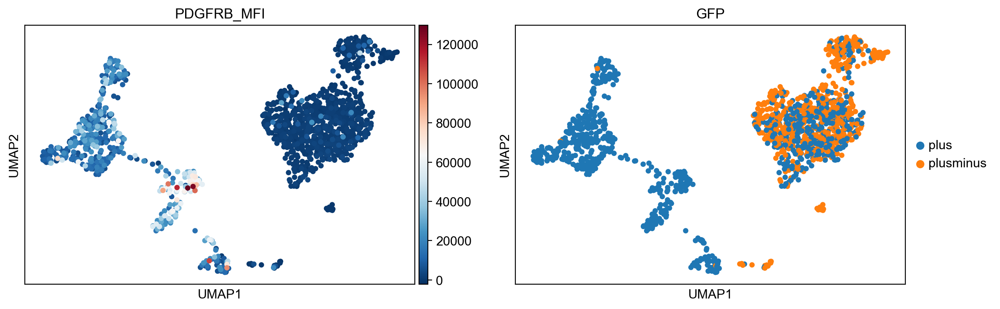

In [76]:
sc.pl.umap(adata, color=['PDGFRB_MFI', 'GFP'])

In [116]:
adata.layers['counts'] = adata.X.copy()
sc.pp.log1p(adata)
adata.layers['log1p'] = adata.X.copy()

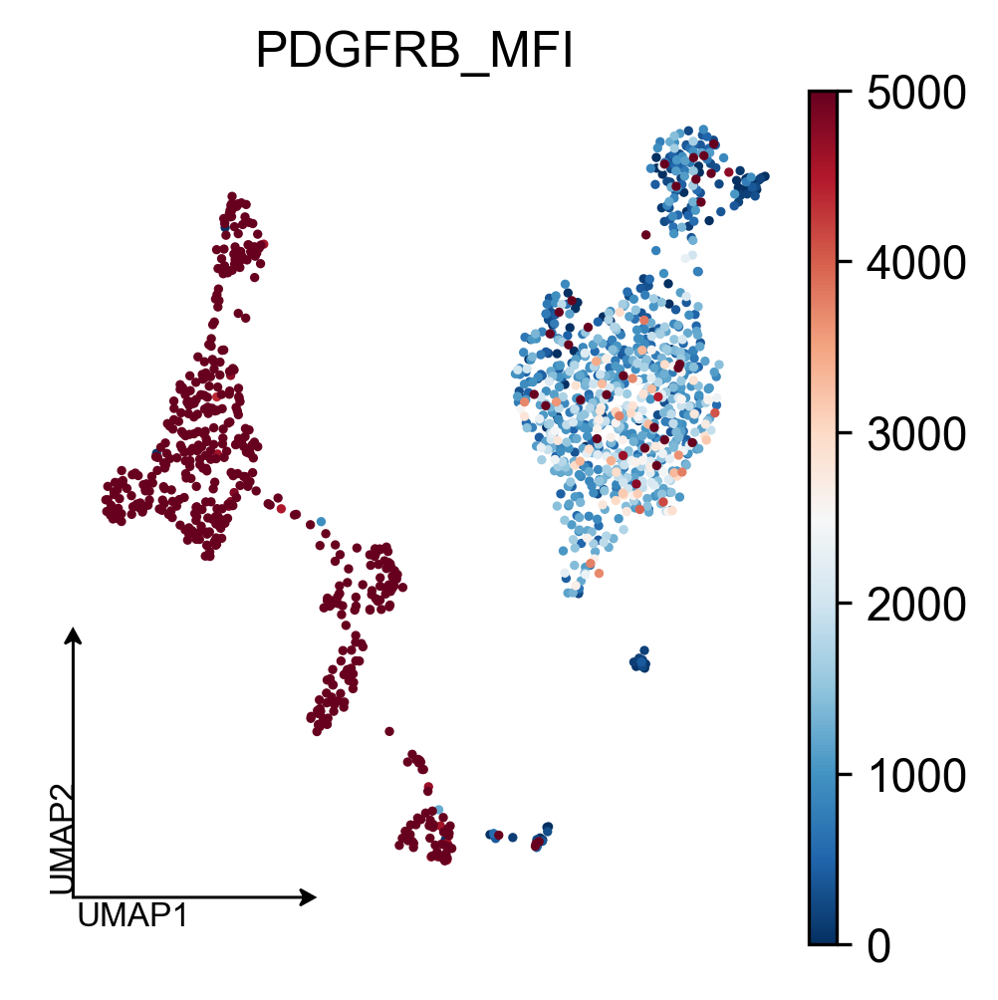

In [153]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 150, "figure.frameon": False}):
    plot_umap(adata, groupby='PDGFRB_MFI', vmin=0, vmax=5000, size=dotsize, alpha=alpha, fontsize=fontsize, fig_dir=fig_dir, legend_loc='upper_right')

In [78]:
adata.uns['GFP_colors'] = ['#64BF73', '#D81B60']

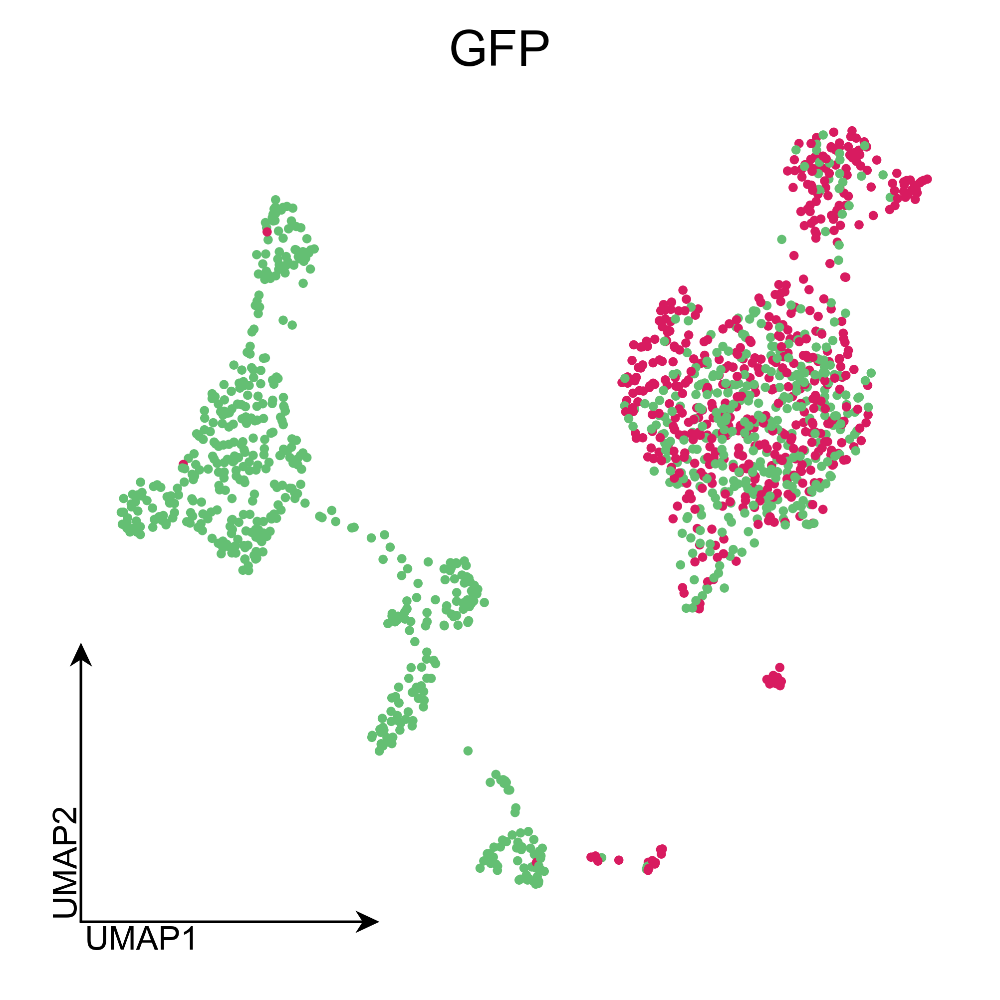

In [79]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata, 'GFP', size=dotsize, alpha=alpha, fontsize=fontsize, fig_dir=fig_dir, legend_loc='upper_right')

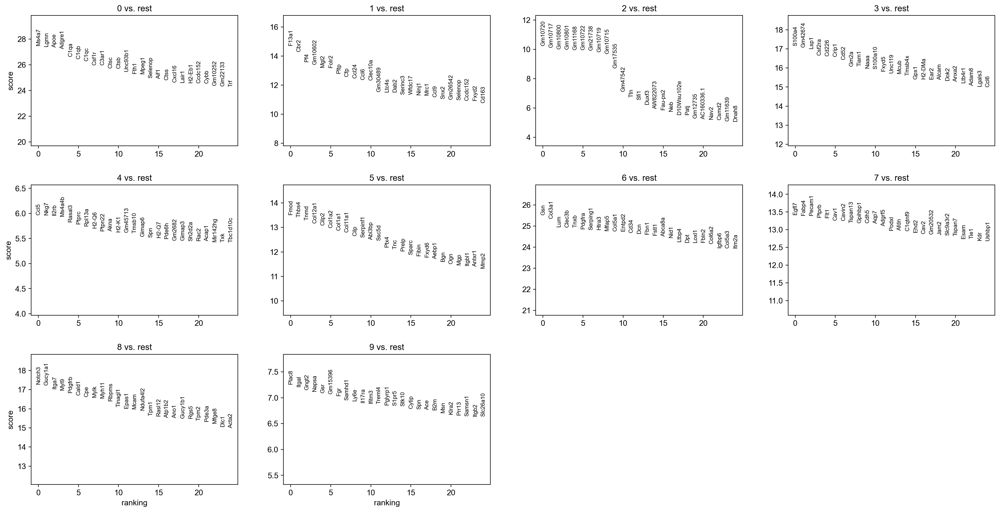

In [80]:
sc.tl.rank_genes_groups(adata, 'cluster', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False, key="wilcoxon")

In [81]:
import anndata as ad
adata_nongm = adata[:, ~adata.var_names.str.startswith('Gm')]
adata_nongm.raw = ad.AnnData(X=adata_nongm.raw[:, ~adata_nongm.raw.var_names.str.startswith('Gm')].X, var=adata_nongm.raw[:, ~adata_nongm.raw.var_names.str.startswith('Gm')].var)

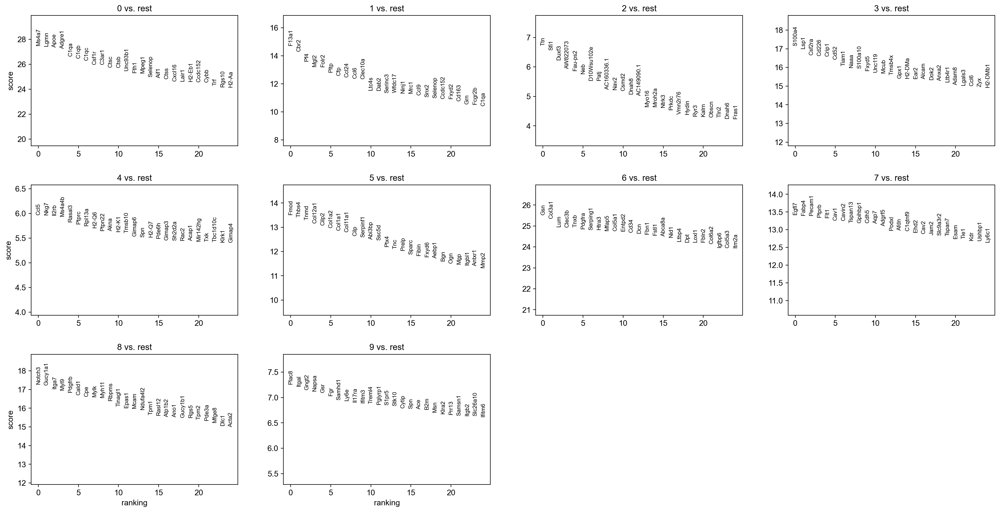

In [82]:
sc.tl.rank_genes_groups(adata_nongm, 'cluster', method='wilcoxon', key_added = "wilcoxon")
sc.pl.rank_genes_groups(adata_nongm, n_genes=25, sharey=False, key="wilcoxon")

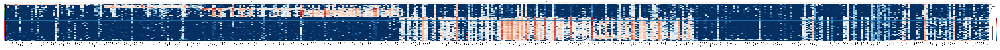

In [142]:
heatmap = sc.pl.rank_genes_groups_heatmap(adata_nongm, n_genes=50, key="wilcoxon", groupby="cluster", show_gene_labels=True, save=True)

In [89]:
heatmap

In [90]:
adata.raw.shape

(1425, 38178)

In [91]:
sc.tl.rank_genes_groups(adata, groupby="cluster", use_raw=True, method='wilcoxon')

In [92]:
for cl in adata.obs['cluster'].cat.categories:
    df = sc.get.rank_genes_groups_df(adata, group=cl, pval_cutoff=1e-05)
    df.to_csv(csv_dir + '%s_vs_rest.with_gm.sig_genes.csv' %cl, index=False)

In [93]:
sc.tl.rank_genes_groups(adata_nongm, groupby="cluster", use_raw=True, method='wilcoxon')

In [94]:
for cl in adata_nongm.obs['cluster'].cat.categories:
    df = sc.get.rank_genes_groups_df(adata_nongm, group=cl, pval_cutoff=1e-05)
    df.to_csv(csv_dir + '%s_vs_rest.sig_genes.csv' %cl, index=False)

In [95]:
adata_d21_subset = adata_d21[adata_d21.obs['cluster'].isin(['0', '1', '2', '8'])]

In [96]:
sc.tl.draw_graph(adata_d21_subset)

Trying to set attribute `.uns` of view, copying.


In [97]:
sc.tl.paga(adata_d21_subset, groups='cluster')

AttributeError: 'NoneType' object has no attribute 'copy'

In [ ]:
adata_d21_subset.uns['iroot'] = np.flatnonzero(adata_d21_subset.obs['cluster_ct'] == '0')[0]
sc.tl.diffmap(adata_d21_subset)
sc.tl.dpt(adata_d21_subset)
adata_d21_subset.obs['pseudotime'] = adata_d21_subset.obs['dpt_pseudotime']
with plt.rc_context({"figure.figsize": (3.5, 1.6), 'figure.frameon':False}):
    graph_fa = sc.pl.draw_graph(adata_d21_subset, color=['cluster_ct', 'pseudotime'], legend_loc='on data', color_map='viridis',
                 frameon=False, size=20, legend_fontsize='small', legend_fontweight='light', layout='fa', return_fig=True)
    graph_fa.savefig(fig_dir + 'draw_graph_fa.subset.pdf', bbox_inches='tight')

In [ ]:
with plt.rc_context({"figure.figsize": (3.5, 3.5), "figure.dpi": 300, "figure.frameon": False}):
    plot_umap(adata, 'doublet_scores', size=dotsize, alpha=alpha, fontsize=fontsize, fig_dir=fig_dir, legend_loc='upper_right')